# Customer Analysis

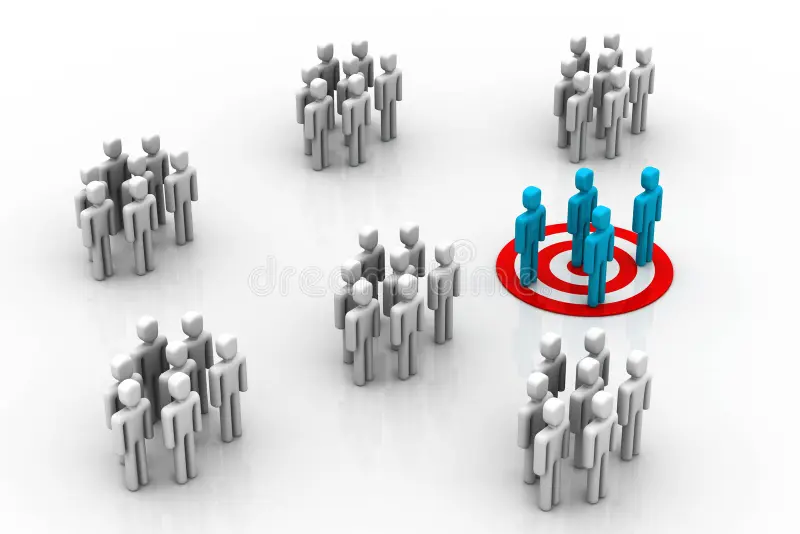

### Overview
A well known company with numerous products needs to **analyze their customer behavior and
classify them whether they will accept the campaigns held by the company**. Also, cluster the
customers into different segments.
***

### Project Goals:
The primary objectives of this data science project are as follows:

- **Exploratory Data Analysis (EDA)**: The project will begin with a comprehensive exploration of the dataset, aiming to identify trends, patterns, and unique insights in the customer data.

- **Data Processing**: Data preprocessing steps will be performed to clean, transform, and prepare the data for machine learning modeling. This includes handling missing values, encoding categorical variables, and scaling features as needed.

- **Model Building**: Machine learning algorithms for both classification (predicting campaign acceptance) and clustering (segmentation) will be employed to create predictive models. Classification models will help identify customers likely to accept campaigns, while clustering will group customers with similar characteristics.

- **Model Evaluation**: The performance of the classification and clustering models will be rigorously assessed using appropriate evaluation metrics, such as accuracy, precision, recall, and silhouette score for clustering.

- **Data Visualization**: Visualizations and charts will be used to present findings and insights derived from the data. These visualizations will help in understanding customer behaviors and campaign acceptance patterns.

- [Data Understanding](#Data-Understanding)
- [Data Preparation](#Data-Preparation)
- [Feature Understanding](#Feature-Understanding)
    - [Demographic Insights](#Demographic-Insights)
    - [Time Series Analysis](#Time-Series-Analysis)
- [Feature Relationship](#Feature-Relationship)
    - [Education-Based EDA](#Education-Based-EDA)
    - [Marital Status-Based EDA](#Marital-Status-Based-EDA)
    - [Income-Based EDA](#Income-Based-EDA)
    - [Household Composition EDA](#Household-Composition-EDA)
    - [Campaign Response EDA](#Campaign-Response-EDA)
    - [Customer Complaint EDA](#Customer-Complaint-EDA)
    - [Correlation Analysis](#Correlation-Analysis)
- [Encoding](#Encoding)
- [Feature Scaling](#Feature-Scaling)
- [Dimensionality Reduction](#Dimensionality-Reduction)
    - [Principal Component Analysis](#PCA)
    - [T-Distributed Stochastic Neighbourhood Embedding](#t-SNE)
- [Clustering](#Clustering)
    - [Hierarchical Clustering](#Hierarchical-Clustering)
    - [K Means Clustering](#K-Means-Clustering)
- [Classification](#Classification)
    - [Feature Importance Analysis](#Feature-importance)
    - [Decision Tree](#Decision-Tree)
    - [Random Forest](#Random-Forest)
    - [SVM](#SVM)
    - [KNN](#KNN)
    - [Boosting](#Boosting)


#### importing libraries

In [354]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()
pd.set_option('display.max_columns', 200)

#### Loading Dataset

In [355]:

df = pd.read_csv('customer_train.csv')

## Data Understanding

In [356]:
df.head()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,0,5524,1957,S1,Lajang,58138000.0,0,0,04-09-2012,58,635000,88000,546000,172000,88000,88000,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1,1,2174,1954,S1,Lajang,46344000.0,1,1,08-03-2014,38,11000,1000,6000,2000,1000,6000,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,2,2,4141,1965,S1,Bertunangan,71613000.0,0,0,21-08-2013,26,426000,49000,127000,111000,21000,42000,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,3,3,6182,1984,S1,Bertunangan,26646000.0,1,0,10-02-2014,26,11000,4000,20000,10000,3000,5000,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,4,4,5324,1981,S3,Menikah,58293000.0,1,0,19-01-2014,94,173000,43000,118000,46000,27000,15000,5,5,3,6,5,0,0,0,0,0,0,3,11,0


<div class="alert alert-block alert-info">
    
### About dataset:
#### People
- **ID**: Customer's unique identifier
- **Year_Birth**: Customer's birth year
- **Education**: Customer's education level
- **Marital_Status**: Customer's marital status
- **Income**: Customer's yearly household income
- **Kidhome**: Number of children in customer's household
- **Teenhome**: Number of teenagers in customer's household
- **Dt_Customer**: Date of customer's enrollment with the company
- **Recency**: Number of days since customer's last purchase
- **Complain**: 1 if the customer complained in the last 2 years, 0 otherwise

#### Products
- **MntWines**: Amount spent on wine in last 2 years
- **MntFruits**: Amount spent on fruits in last 2 years
- **MntMeatProducts**: Amount spent on meat in last 2 years
- **MntFishProducts**: Amount spent on fish in last 2 years
- **MntSweetProducts**: Amount spent on sweets in last 2 years
- **MntGoldProds**: Amount spent on gold in last 2 years
        
#### Promotion
- **NumDealsPurchases**: Number of purchases made with a discount
- **AcceptedCmp1**: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- **AcceptedCmp2**: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- **AcceptedCmp3**: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- **AcceptedCmp4**: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- **AcceptedCmp5**: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- **Response**: 1 if customer accepted the offer in the last campaign, 0 otherwise
        
#### Place
- **NumWebPurchases**: Number of purchases made through the company’s website
- **NumCatalogPurchases**: Number of purchases made using a catalogue
- **NumStorePurchases**: Number of purchases made directly in stores
- **NumWebVisitsMonth**: Number of visits to company’s website in the last month



</div>


In [357]:
df.shape

(1680, 31)

In [358]:
df.columns

Index(['Unnamed: 0.1', 'Unnamed: 0', 'ID', 'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Z_CostContact',
       'Z_Revenue', 'Response'],
      dtype='object')

In [359]:
df.dtypes

Unnamed: 0.1             int64
Unnamed: 0               int64
ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntCoke                  int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostContact            int64
Z_Revenue                int64
Response                 int64
dtype: object

In [360]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1680 entries, 0 to 1679
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0.1         1680 non-null   int64  
 1   Unnamed: 0           1680 non-null   int64  
 2   ID                   1680 non-null   int64  
 3   Year_Birth           1680 non-null   int64  
 4   Education            1680 non-null   object 
 5   Marital_Status       1680 non-null   object 
 6   Income               1663 non-null   float64
 7   Kidhome              1680 non-null   int64  
 8   Teenhome             1680 non-null   int64  
 9   Dt_Customer          1680 non-null   object 
 10  Recency              1680 non-null   int64  
 11  MntCoke              1680 non-null   int64  
 12  MntFruits            1680 non-null   int64  
 13  MntMeatProducts      1680 non-null   int64  
 14  MntFishProducts      1680 non-null   int64  
 15  MntSweetProducts     1680 non-null   i

In [361]:
df.describe()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,1680.000000,1680.000000,1680.000000,1680.000000,1.663000e+03,1680.000000,1680.000000,1680.000000,1.680000e+03,1680.000000,1.680000e+03,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.000000,1680.0,1680.0,1680.000000
mean,839.500000,839.500000,5551.728571,1968.847619,5.201434e+07,0.452381,0.500000,49.083333,3.048994e+05,25918.452381,1.657738e+05,36954.761905,27016.666667,43339.880952,2.338690,4.041071,2.670833,5.789286,5.332143,0.071429,0.074405,0.069048,0.062500,0.011905,0.010119,3.0,11.0,0.144048
std,485.118542,485.118542,3238.155703,12.027192,2.148248e+07,0.546901,0.550055,28.930637,3.387051e+05,39532.059109,2.242424e+05,54165.456719,41529.595304,51363.336472,1.966104,2.673427,2.972874,3.245504,2.449814,0.257616,0.262507,0.253611,0.242134,0.108490,0.100113,0.0,0.0,0.351243
min,0.000000,0.000000,0.000000,1893.000000,1.730000e+06,0.000000,0.000000,0.000000,0.000000e+00,0.000000,1.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,419.750000,419.750000,2823.250000,1960.000000,3.568800e+07,0.000000,0.000000,24.000000,2.400000e+04,1000.000000,1.600000e+04,3000.000000,1000.000000,9000.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,839.500000,839.500000,5381.000000,1970.000000,5.125000e+07,0.000000,0.000000,50.000000,1.730000e+05,8000.000000,6.800000e+04,12000.000000,8000.000000,24000.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,1259.250000,1259.250000,8370.750000,1977.000000,6.812200e+07,1.000000,1.000000,74.000000,4.942500e+05,32000.000000,2.322500e+05,48000.000000,32000.000000,54250.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,1679.000000,1679.000000,11191.000000,1996.000000,1.623970e+08,2.000000,2.000000,99.000000,1.492000e+06,199000.000000,1.725000e+06,259000.000000,263000.000000,362000.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


<div class="alert alert-block alert-info">
The values in both "Z_CostContact" and "Z_Revenue" columns are same for every row (3.0 and 11.0 respectively)
</div>

## Data Preparation

In [362]:
# dropping irrevalent columns
df = df[[#'Unnamed: 0.1', 'Unnamed: 0', 'ID', 
       'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 
        #'Z_CostContact', 'Z_Revenue', 
       'Response']].copy()
df.shape

(1680, 26)

In [363]:
# converting datatypes of specific columns
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'], format='%d-%m-%Y')
df[['Dt_Customer']].head()

,Dt_Customer
0,2012-09-04
1,2014-03-08
2,2013-08-21
3,2014-02-10
4,2014-01-19


In [364]:
# renaming columns
df = df.rename(columns = {'Marital_Status': 'Marital_status',
                    'Kidhome': 'Kids',
                    'Teenhome': 'Teens',
                    'Dt_Customer': 'Enrollment_date',
                    'MntCoke': 'Coke',
                    'MntFruits': 'Fruits',
                    'MntMeatProducts': 'Meat',
                    'MntFishProducts': 'Fish',
                    'MntSweetProducts': 'Sweets',
                    'MntGoldProds': 'Gold',
                    'NumDealsPurchases': 'Purchase_ct_with_deals',
                    'NumCatalogPurchases': 'Catalog_purchase_ct', 
                    'NumStorePurchases': 'Store_purchase_ct',
                    'NumWebPurchases': 'Web_purchase_ct',
                    'NumWebVisitsMonth': 'Web_visits_ct (last_month)',
                    'AcceptedCmp3': 'Cmp3', 
                    'AcceptedCmp4': 'Cmp4', 
                    'AcceptedCmp5': 'Cmp5', 
                    'AcceptedCmp1': 'Cmp1',
                    'AcceptedCmp2': 'Cmp2'})
df.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,1957,S1,Lajang,58138000.0,0,0,2012-09-04,58,635000,88000,546000,172000,88000,88000,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,S1,Lajang,46344000.0,1,1,2014-03-08,38,11000,1000,6000,2000,1000,6000,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,S1,Bertunangan,71613000.0,0,0,2013-08-21,26,426000,49000,127000,111000,21000,42000,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,S1,Bertunangan,26646000.0,1,0,2014-02-10,26,11000,4000,20000,10000,3000,5000,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,S3,Menikah,58293000.0,1,0,2014-01-19,94,173000,43000,118000,46000,27000,15000,5,5,3,6,5,0,0,0,0,0,0,0


In [365]:
df['Marital_status'].unique()

array(['Lajang', 'Bertunangan', 'Menikah', 'Cerai', 'Janda', 'Duda'],
      dtype=object)

In [366]:
df['Marital_status'].replace({'Lajang': 'Single', 
                              'Bertunangan': 'Engaged', 
                              'Menikah': 'Married', 
                              'Cerai': ' Divorced', 
                              'Janda': 'Widow', 
                              'Duda': 'Widower'}, inplace=True)

In [367]:
df[['Marital_status']].head()

,Marital_status
0,Single
1,Single
2,Engaged
3,Engaged
4,Married


In [368]:
df['Household_size'] = np.where((df['Marital_status'] == 'Married') | (df['Marital_status'] == 'Engaged'),
                                2 + df['Kids'] + df['Teens'],
                                1 + df['Kids'] + df['Teens'])

In [369]:
df['Education'].unique()

array(['S1', 'S3', 'S2', 'SMA', 'D3'], dtype=object)


<div class="alert alert-block alert-info">
In Indonesian, the values ['S1', 'S3', 'S2', 'SMA', 'D3'] typically represent different levels of education.

- **S1**: This refers to "Strata 1" or the first level of higher education, equivalent to a Bachelor's degree (Sarjana/Sarjana/S1).

- **S3**: "Strata 3" represents the third level of higher education, which typically corresponds to a Doctorate or PhD (Doktor/S3).

- **S2**: "Strata 2" denotes the second level of higher education, usually a Master's degree (Magister/S2).

- **SMA**: "Sekolah Menengah Atas" refers to high school or upper secondary education. It is the stage of education following junior high school (SMP) and preceding higher education.

- **D3**: "Diploma 3" signifies a three-year diploma program at the tertiary level, which is shorter than a Bachelor's degree program but still a form of higher education.

</div>


In [370]:
df['Education'].replace({'SMA': 'HS', 
                         'D3': 'Diploma', 
                         'S1': 'UG', 
                         'S2': ' PG', 
                         'S3': 'PhD'}, inplace=True)

In [371]:
df[['Education']].head()

,Education
0,UG
1,UG
2,UG
3,UG
4,PhD


In [372]:
# to find duplicate columns
df.duplicated().sum()

109

In [373]:
df.loc[df.duplicated()]

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size
83,1963,PG,Engaged,38620000.0,0,0,2013-05-11,56,112000,17000,44000,34000,22000,89000,1,2,5,3,3,0,0,0,0,0,0,0,2
179,1951,Diploma,Married,78497000.0,0,0,2013-12-01,44,207000,26000,447000,75000,0,223000,1,5,7,12,2,0,0,0,1,0,0,0,2
281,1976,UG,Engaged,51369000.0,0,1,2012-10-25,84,297000,7000,79000,0,11000,182000,2,8,2,4,8,0,0,0,0,0,0,0,3
282,1946,UG,Engaged,37760000.0,0,0,2012-08-31,20,84000,5000,38000,150000,12000,28000,2,4,1,6,7,0,0,0,0,0,0,0,2
363,1978,PhD,Married,37717000.0,1,0,2012-11-23,31,9000,0,6000,4000,1000,5000,1,1,0,2,9,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1643,1979,HS,Engaged,24594000.0,1,0,2013-12-10,94,1000,3000,6000,10000,0,9000,1,1,0,3,5,0,0,0,0,0,0,0,3
1664,1989,PhD,Single,33996000.0,0,0,2013-09-11,46,40000,2000,15000,8000,0,6000,1,1,1,3,4,0,0,0,0,0,0,0,1
1668,1970,PhD,Married,69084000.0,1,0,2013-11-19,43,1181000,107000,199000,39000,30000,30000,2,7,3,13,8,0,0,0,0,0,0,0,3
1669,1967,PhD,Married,77766000.0,0,1,2013-02-22,97,1004000,59000,265000,115000,59000,27000,2,11,10,11,6,1,0,0,0,0,0,1,3


In [374]:
df.loc[df['Income'] == 38620000]

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size
31,1963,PG,Engaged,38620000.0,0,0,2013-05-11,56,112000,17000,44000,34000,22000,89000,1,2,5,3,3,0,0,0,0,0,0,0,2
83,1963,PG,Engaged,38620000.0,0,0,2013-05-11,56,112000,17000,44000,34000,22000,89000,1,2,5,3,3,0,0,0,0,0,0,0,2


In [375]:
df.loc[df['Income'] == 78497000]

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size
98,1951,Diploma,Married,78497000.0,0,0,2013-12-01,44,207000,26000,447000,75000,0,223000,1,5,7,12,2,0,0,0,1,0,0,0,2
179,1951,Diploma,Married,78497000.0,0,0,2013-12-01,44,207000,26000,447000,75000,0,223000,1,5,7,12,2,0,0,0,1,0,0,0,2


In [376]:
df = df.loc[~df.duplicated()].reset_index(drop=True)

In [377]:
df.duplicated().sum()

0

In [ ]:
# to detect null columns
df.isna().sum()

In [ ]:
df.loc[df['Income'].isna(), 'Income'] = df['Income'].median()

In [ ]:
df['Income'].isna().sum()

In [ ]:
df['Age'] = 2023 - df['Year_Birth']
df[['Age', 'Year_Birth']].head()

In [ ]:
print("Minimum of Age:", df['Age'].min())
print("Maximum of Age:", df['Age'].max())
print("Mean of Age:", df['Age'].mean())
print("Median of Age:", df['Age'].median())
print("Mode of Age:", df['Age'].mode())

In [ ]:
df.drop(['Year_Birth'], axis=1, inplace=True)

In [ ]:
df['Total_amount'] = df['Coke'] + df['Fruits'] + df['Meat'] + df['Fish'] + df['Sweets'] + df['Gold']

## Feature Understanding

In [ ]:
df.head()

### Demographic Insights



- What is the distribution of customers' Age?
- What is the distribution of customers' education levels (Education)?
- What is the distribution of customers' marital statuses (Marital_Status)?
- How is the household income (Income) distributed among customers?
- How is the household size distributed among customers?
- What is the distribution of amount spent on each product?

In [ ]:
plt.figure(figsize=(8,5))

sns.histplot(df['Age'], kde=True)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title("Distribution of customers' Age")

plt.show()

In [ ]:
# iqr method
q1 = df.Age.quantile(0.25)
q3 = df.Age.quantile(0.75)

iqr = q3-q1
iqr

In [ ]:
lower = q1 - 1.5*iqr
upper = q3 + 1.5*iqr

# outliers
df[(df.Age<lower) | (df.Age>upper)][['Age']].head()

In [ ]:
df = df[(df.Age>lower) & (df.Age<upper)]

In [ ]:
plt.figure(figsize=(5,4))

sns.histplot(df['Age'], kde=True)
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title("Distribution of customers' Age\n(After outlier removal)")

plt.show()

<div class="alert alert-block alert-info">
Majority of customers' age lies between 45 and 70
</div>

In [ ]:
sns.countplot(x=df['Education'])
plt.title("Distribution of customers' education level")
plt.show()

In [ ]:
plt.figure(figsize=(6, 6))

count = df.Education.value_counts()
label = count.index

plt.pie(count, labels=label, autopct='%.2f %%')
plt.title("Distribution of cutomers' Education")

plt.show()

<div class="alert alert-block alert-info">
Majority of customers' are highly educated. 
almost 50% are under graduate, followed by PhD - 22.34%, 16.55% of Post Graduate and 9.36% of Diploma
only a very small proportion of 2.10% customers are High Schoolers
</div>

In [ ]:
ax = df['Marital_status'].value_counts() \
    .plot(kind='bar', 
          title="Distribution of Customers' Marital Status",
          color='#98caca')
ax.set_xlabel('Marital Status')
ax.set_ylabel('Count')

# Annotate each bar with its count
for i, count in enumerate(df['Marital_status'].value_counts()):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.show()

In [ ]:
plt.figure(figsize=(8,5))

sns.histplot(df['Income'], kde=True)
plt.xlabel('Income')
plt.ylabel('Frequency')
plt.title('Income Distribution')

plt.show()

In [ ]:
from scipy.stats import skew, kurtosis
df['Income'].skew()

<div class="alert alert-block alert-info">
skewness between -0.5 and 0.5 are considered fairly symmetrical
</div>

In [ ]:
kurtosis(df['Income'], fisher=False)

<div class="alert alert-block alert-info">

Kurtosis > 3 is Leptokurtic;
meaning it has heavier tails than a normal distribution
    
</div>

In our case, a heavier positive tail; indicating presence of a few extremely high income customers

In [ ]:
# iqr method
q1 = df.Income.quantile(0.25)
q3 = df.Income.quantile(0.75)

iqr = q3-q1
iqr

In [ ]:
lower = q1 - 1.5*iqr
upper = q3 + 1.5*iqr

# outliers
df[(df.Income<lower) | (df.Income>upper)][['Income']].head()

In [ ]:
df = df[(df.Income>lower) & (df.Income<upper)]

In [ ]:
# plot histogram to check if it is in normal distribution
sns.histplot(data=df, x=df["Income"], kde=True)
plt.title("Income Distribution after outlier removal")
plt.show()

In [ ]:
df['Income'].skew()

In [ ]:
kurtosis(df['Income'], fisher=False)

In [ ]:
ax = df['Household_size'].value_counts() \
    .plot(kind='bar', 
          title="Distribution of Customers' Household_size",
          color='#98caca')
ax.set_xlabel('Household_size')
ax.set_ylabel('Count')

# Annotate each bar with its count
for i, count in enumerate(df['Household_size'].value_counts()):
    ax.text(i, count, str(count), ha='center', va='bottom')

plt.show()

In [ ]:
prods = ['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']
for prod in prods:
    sns.kdeplot(df[prod], label=prod, fill=True)

plt.xlabel("Amount spent by customers")
plt.legend()
plt.show()

In [ ]:
plt.figure(figsize=(8,6), dpi=100)

products = [df[prod] for prod in prods]
labels = ["Coke", "Fruits", "Meat", "Fish", "Sweets", "Gold"]
          
bp = plt.boxplot(products,
                 labels=labels,
                 patch_artist=True, 
                 medianprops={'linewidth': 2})

plt.title('Distribution of amount spent on different products')
plt.ylabel('Amount')

for box in bp['boxes']:
    box.set(color='#4286f4', linewidth=2)
    box.set(facecolor = '#e0e0e0')
    
plt.show()

<div class="alert alert-block alert-info">

 Some data points outside the Interquartile Range (IQR) may not necessarily indicate outliers. These values could be a result of seasonal price hikes or other factors affecting the data.
    
</div>

In [ ]:
sns.kdeplot(df['Total_amount'], fill=True)

plt.vlines(x=df['Total_amount'].mean(), ymin=0, ymax=plt.gca().get_ylim()[1], lw=1, linestyle='--', color='red')
plt.vlines(x=df['Total_amount'].median(), ymin=0, ymax=plt.gca().get_ylim()[1], lw=1, linestyle='--', color='green')
plt.vlines(x=df['Total_amount'].mode(), ymin=0, ymax=plt.gca().get_ylim()[1], lw=1, linestyle='--', color='blue')

plt.show()

In [ ]:
print("Mean of total amount spent:", df['Total_amount'].mean())
print("Median of total amount spent:", df['Total_amount'].median())
print("Mode of total amount spent:", df['Total_amount'].mode()[0])
print("Minimum of total amount spent:", df['Total_amount'].min())
print("Maximum of total amount spent:", df['Total_amount'].max())

In [ ]:
plt.figure(figsize=(6, 6))
amt = [df[prod].sum() for prod in prods]

plt.pie(amt, labels=prods, autopct='%.2f %%', pctdistance=.8)
plt.title("Distribution of amount spent for each products")
plt.show()

<div class="alert alert-block alert-info">

 it's evident that 'Coke' accounts for the largest share at 50.76%, followed by 'Meat' at 27.15%.
    
</div>

In [ ]:
amt_median = []
for prod in prods:
    amt_median.append(df[prod].median())
    
sns.barplot(x=prods, y=amt_median)
plt.title("Comparison of the median of amount spent on each product")
plt.show()

In [ ]:
count = []

for prod in prods:
    count.append(df.loc[df[prod]>0, prod].size)

prod_count = pd.DataFrame([prods, count], index=['Products', 'Count']).T
prod_count

In [ ]:
plt.bar(prod_count['Products'], prod_count['Count'])
plt.title('Count of customers who have bought various products')
plt.show()

<div class="alert alert-block alert-info">

Among our dataset of 1680 customers, it is worth highlighting that a significant proportion of customers have purchased products from all available categories at some point in time. This trend is evident from the consistent count of customers engaging with each product category, which typically ranges from 1200 to 1600. This implies that a substantial portion of our customer base has explored and made purchases across various product types, indicating a diverse and engaged customer community. While this finding underscores a broad customer interest in our product range, the specific reasons behind this trend would necessitate further investigation and analysis.
    
</div>

### Time Series Analysis



- Analyze trends in customer enrollment (Enrollment_date) over time.
- Calculate and visualize the average recency.

In [ ]:
plt.figure(figsize=(8,5))

sns.histplot(df['Enrollment_date'])
plt.xlabel('Enrollment date')
plt.ylabel('Frequency')
plt.title('Customer enrollment frequency over time')

plt.show()

<div class="alert alert-block alert-info">
Enrollment count is consistent over time
</div>

In [ ]:
# Extract month and year from the 'Enrollment_date' column
df['Enrollment_Month'] = df['Enrollment_date'].dt.to_period('M')

# Calculate the count of enrollments per month
enrollment_counts = df['Enrollment_Month'].value_counts().sort_index()

# Create a time series plot
plt.figure(figsize=(12, 6))
enrollment_counts.plot(kind='line')
plt.xlabel('Enrollment Month')
plt.ylabel('Enrollment Count')
plt.title('Customer Enrollment Trends Over Time')
plt.xticks(rotation=45)
plt.show()

In [ ]:
plt.figure(figsize=(8,5))

sns.histplot(df['Recency'], kde=True)
plt.xlabel("Number of days since customer's last purchase")
plt.ylabel('Frequency')
plt.title('Customer recency distribution')

plt.show()

In [ ]:
# Calculate the average recency per enrollment month
average_recency = df.groupby('Enrollment_Month')['Recency'].mean()

# Create a time series plot
plt.figure(figsize=(12, 6))
average_recency.plot(kind='line')
plt.xlabel('Enrollment Month')
plt.ylabel('Average Recency')
plt.title('Average Recency Over Time (Based on Enrollment Month)')
plt.xticks(rotation=45)
plt.show()

<div class="alert alert-block alert-info">

customers who enrolled in sept of 2012 and oct of 2013 tend to have the lowest recency 

</div>

In [ ]:
df.drop('Enrollment_Month', axis=1, inplace=True)

In [ ]:
min = df['Recency'].min()
max = df['Recency'].max()
mean = df['Recency'].mean()
median = df['Recency'].median()
print(f"Minimum of Customers' Recency: {min}")
print(f"Maximum of Customers' Recency: {max}")
print(f"Mean of Customers' Recency: {mean}")
print(f"Median of Customers' Recency: {median}")

## Feature Relationship

### Education-Based EDA



- Group and compare customer behavior metrics (e.g., spending, campaign acceptance) based on education level.
- Create box plots, bar charts, or violin plots to visualize differences in behavior among education groups.

In [ ]:
edu = df['Education'].unique().tolist()
edu

In [ ]:
sns.scatterplot(x=df['Age'], y=df['Income'], hue=df['Education'], palette='magma')
plt.show()

In [ ]:
sns.scatterplot(x=df['Income'], y=df['Total_amount'], hue=df['Education'], palette='magma')
plt.show()

<div class="alert alert-block alert-info">

- No particular pattern in Age or Income Education-wise;
but high schoolers tend to have lower Income and Age; but since the proportion of highschoolers are low, it cannot be concluded
    
- Though higher income customers tend to spend more; there is no relation to education
</div>

In [ ]:
cols = ['Age', 'Income']

for col in cols:
    plt.figure(figsize=(5,4), dpi=100)

    feature = [df.loc[df['Education']==i, col] for i in edu]

    bp = plt.boxplot(feature,
                     labels=edu,
                     patch_artist=True, 
                     medianprops={'linewidth': 2})

    plt.title(f'Distribution of {col} by Education')
    plt.ylabel(col)

    for box in bp['boxes']:
        box.set(color='#4286f4', linewidth=2)
        box.set(facecolor = '#e0e0e0')
    
    plt.show()

<div class="alert alert-block alert-info">

- The box plot reveals that there is no specific pattern in customer age based on education, except for high schoolers.

- High schoolers tend to be younger compared to all other education groups. The first quartile (Q1) and the third quartile (Q3) for high schoolers' age typically fall in the range of around 36 to 49. However, it's essential to note that this age range may vary depending on when the dataset was collected, and the ages of customers at the time of data collection could be even lower.

- In terms of income, as expected, high schoolers have the lowest income among all education categories. Interestingly, customers with a diploma have a wide range of income, as indicated by the larger box size.

- Among all the education categories, customers with a Ph.D. have the highest median income, suggesting a generally higher income level within this group.
</div>

In [ ]:
df_spent_by_edu = pd.DataFrame(columns=['Education'] + prods)

result_list = []

for i in edu:
    # Initialize a dictionary to store the spending for each product category
    spent_dict = {'Education': i}
    
    # Calculate spending for each product category
    for prod in prods:
        amt = round(df.loc[df['Education'] == i, prod].mean(), 2)
        spent_dict[prod] = amt
    
    # Append the spending data for this education level to the result list
    result_list.append(spent_dict)

# Create a DataFrame from the list of dictionaries
df_spent_by_edu = pd.DataFrame(result_list)
        
df_spent_by_edu

In [ ]:
ax = df_spent_by_edu.plot(kind='barh', figsize=(6, 5))
ax.set_yticklabels(df_spent_by_edu['Education'])

plt.xlabel('Amount spent')
plt.ylabel('Education')
plt.title('Average amount spent on products by education')

plt.show()

<div class="alert alert-block alert-info">

- Customers' education level appears to have a noticeable influence on their spending behavior. Customers with a Ph.D. degree tend to spend the most on average across various products, while high schoolers consistently spend the least.

- Specifically, Ph.D. holders spend significantly more on 'Coke' and 'Meat' compared to the other education groups. This indicates that these products might be more appealing to customers with higher academic qualifications.

- A consistent spending pattern is observed among all education groups except for high schoolers, who have unique spending behavior. High schoolers spend relatively more on 'Gold' compared to other groups, but it's important to note that their spending on 'Gold' is considerably lower compared to other education categories.

- Interestingly, high schoolers spend the least on 'Coke,' which contradicts the trend seen in the spending behavior of the other education groups. This unique pattern suggests that 'Coke' might not be as popular among high schoolers as it is among customers with higher education levels.
</div>

In [ ]:
df_cmp_acceptance = pd.DataFrame(columns=['Education', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response'])
cmps = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']

result_list = []

for i in edu:
    # Initialize a dictionary to store the acceptance of each campaign
    cmp_dict = {'Education': i}
    
    # Calculate count of acceptance for each campaign
    for cmp in cmps:
        value_counts_result = df.loc[df['Education'] == i, cmp].value_counts()
        count_for_1 = value_counts_result.get(1, 0)
        cmp_dict[cmp] = count_for_1
    
    # Append the count for this campaign to the result list
    result_list.append(cmp_dict)

# Create a DataFrame from the list of dictionaries
df_cmp_acceptance = pd.DataFrame(result_list)

df_cmp_acceptance

In [ ]:
for cmp in cmps:
    grouped_data = df.groupby('Education')[cmp].value_counts().unstack(fill_value=0)
    grouped_data.plot(kind='bar', stacked=True, figsize=(5, 3))
    
    plt.xlabel('Education')
    plt.ylabel('Count')
    plt.title(f'{cmp} by Education')
    plt.legend(title=cmp, loc='upper left')
    
    plt.show()

<div class="alert alert-block alert-info">
    
- The analysis of campaign acceptance rates reveals that, overall, the acceptance rates are relatively low across all education groups.

- Despite the low acceptance rates, there is a notable and consistent increase in campaign acceptance in the last campaign ('Response') across all education levels. This indicates that the last campaign was more effective in terms of customer response compared to previous campaigns. It's possible that the campaign's messaging or timing was more appealing to customers.

- Additionally, the analysis of campaign acceptance highlights that the dataset may suffer from class imbalance. This means that the distribution of accepted and rejected responses in campaigns is skewed. Most customers do not accept campaigns ('0' in Response), leading to imbalanced data. Dealing with imbalanced data may require specific strategies to ensure that the model is not biased towards the majority class and accurately predicts campaign acceptance.
</div>

### Marital Status-Based EDA

- analyze customer behavior based on marital status.
- Determine if there are variations in spending, campaign acceptance, or complaints among marital status categories.

In [ ]:
marital_stat = df['Marital_status'].unique().tolist()
marital_stat

In [ ]:
sns.scatterplot(x=df['Age'], y=df['Income'], hue=df['Marital_status'], palette='pastel')
plt.show()

In [ ]:
sns.scatterplot(x=df['Income'], y=df['Total_amount'], hue=df['Marital_status'], palette='pastel')
plt.show()

In [ ]:
cols = ['Age', 'Income']

for col in cols:
    plt.figure(figsize=(5,4), dpi=100)

    feature = [df.loc[df['Marital_status']==i, col] for i in marital_stat]

    bp = plt.boxplot(feature,
                     labels=marital_stat,
                     patch_artist=True, 
                     medianprops={'linewidth': 2})

    plt.title(f'Distribution of {col} by Marital Status')
    plt.ylabel(col)

    for box in bp['boxes']:
        box.set(color='#4286f4', linewidth=2)
        box.set(facecolor = '#e0e0e0')
    
    plt.show()

<div class="alert alert-block alert-info">

- No particular pattern in Age or Income Marital_status-wise as well; but widows tend to have higher Age and widowers tend to have lower Income
    
- Though higher income customers tend to spend more; there is no relation to Marital_status; All the extreme higher income customers are either engaged or married
</div>

In [430]:
df_spent_by_marital_stat = pd.DataFrame(columns=['Marital_status'] + prods)

result_list = []

for i in marital_stat:
    # Initialize a dictionary to store the spending for each product category
    spent_dict = {'Marital_status': i}
    
    # Calculate spending for each product category
    for prod in prods:
        amt = round(df.loc[df['Marital_status'] == i, prod].mean(), 2)
        spent_dict[prod] = amt
    
    # Append the spending data for this education level to the result list
    result_list.append(spent_dict)

# Create a DataFrame from the list of dictionaries
df_spent_by_marital_stat = pd.DataFrame(result_list)
        
df_spent_by_marital_stat

,Marital_status,Coke,Fruits,Meat,Fish,Sweets,Gold
0,Single,286716.37,27959.06,182345.03,39830.41,27842.11,45505.85
1,Engaged,311486.28,24486.28,161501.25,38162.09,26346.63,41725.69
2,Married,301810.95,24570.48,156981.76,33887.23,26036.48,40242.12
3,Divorced,321920.25,27809.82,147601.23,33932.52,28503.07,48171.78
4,Widow,335100.00,30700.00,160320.00,46720.00,34500.00,48740.00
5,Widower,184666.67,4000.00,26333.33,7666.67,7000.00,27000.00


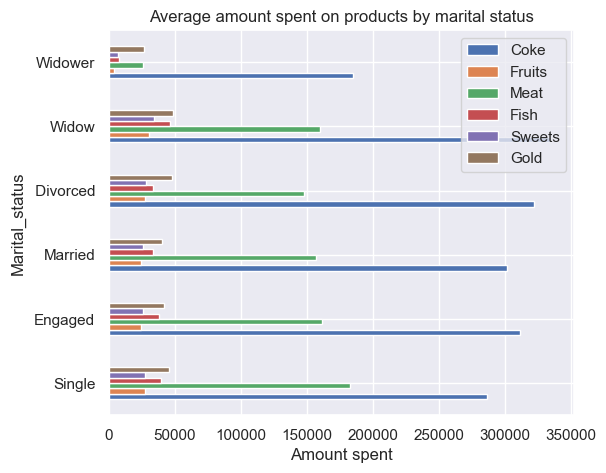

In [431]:
ax = df_spent_by_marital_stat.plot(kind='barh', figsize=(6, 5))
ax.set_yticklabels(df_spent_by_marital_stat['Marital_status'])

plt.xlabel('Amount spent')
plt.ylabel('Marital_status')
plt.title('Average amount spent on products by marital status')

plt.show()

In [432]:
df_cmp_acceptance1 = pd.DataFrame(columns=['Marital_status', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response'])
cmps = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']

result_list = []

for i in marital_stat:
    # Initialize a dictionary to store the acceptance of each campaign
    cmp_dict = {'Marital_status': i}
    
    # Calculate count of acceptance for each campaign
    for cmp in cmps:
        value_counts_result = df.loc[df['Marital_status'] == i, cmp].value_counts()
        count_for_1 = value_counts_result.get(1, 0)
        cmp_dict[cmp] = count_for_1
    
    # Append the count for this campaign to the result list
    result_list.append(cmp_dict)

# Create a DataFrame from the list of dictionaries
df_cmp_acceptance1 = pd.DataFrame(result_list)

df_cmp_acceptance1

,Marital_status,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response
0,Single,25,2,30,22,17,78
1,Engaged,21,8,28,30,30,41
2,Married,41,4,40,47,41,66
3,Divorced,8,4,11,14,11,33
4,Widow,2,0,1,6,4,10
5,Widower,0,0,1,0,0,1


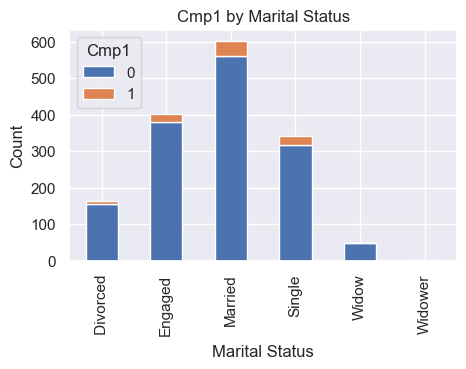

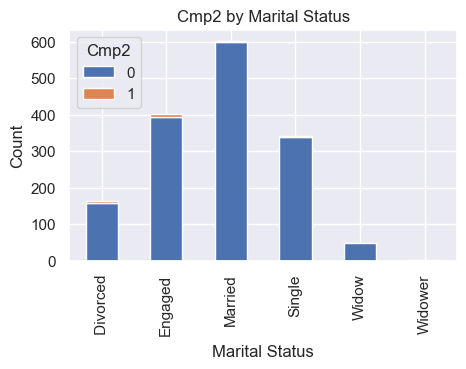

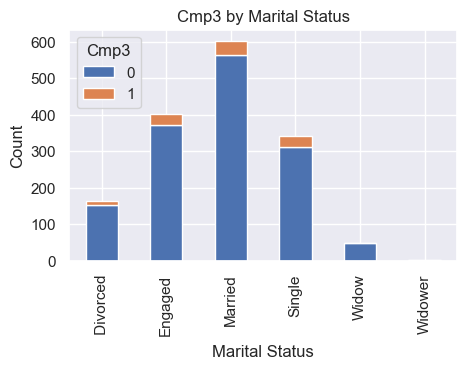

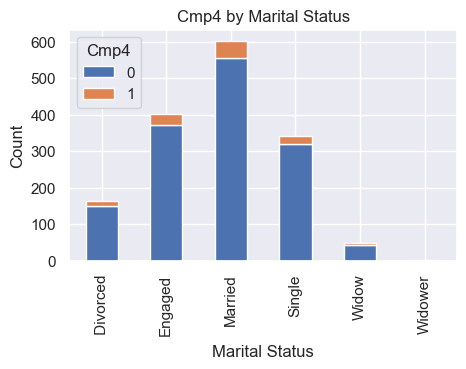

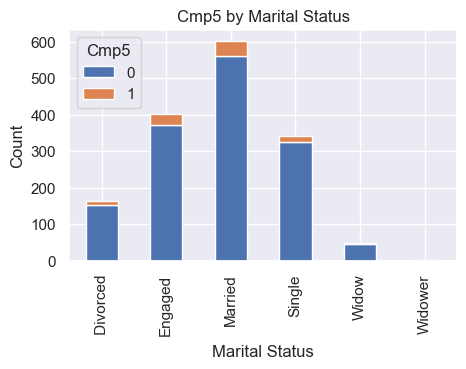

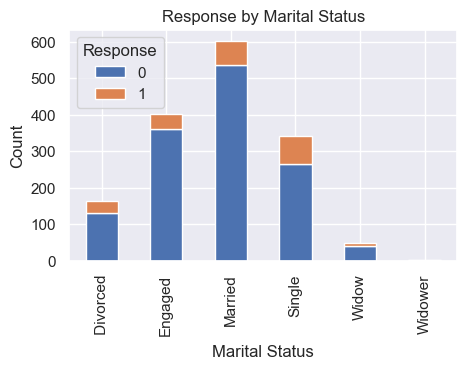

In [433]:
for cmp in cmps:
    grouped_data = df.groupby('Marital_status')[cmp].value_counts().unstack(fill_value=0)
    grouped_data.plot(kind='bar', stacked=True, figsize=(5, 3))
    
    plt.xlabel('Marital Status')
    plt.ylabel('Count')
    plt.title(f'{cmp} by Marital Status')
    plt.legend(title=cmp, loc='upper left')
    
    plt.show()

### Income-Based EDA

- Explore how customer income correlates with spending on various product categories.
- Visualize income distributions among different segments.

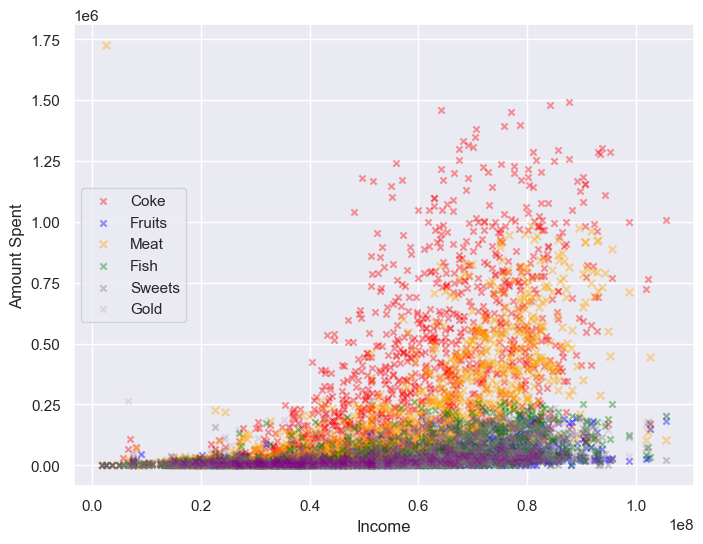

In [434]:
plt.figure(figsize=(8, 6))

plt.scatter(df['Income'], df['Coke'], c='red', alpha=.4, s=20, marker='x')
plt.scatter(df['Income'], df['Fruits'], c='blue', alpha=.4, s=20, marker='x')
plt.scatter(df['Income'], df['Meat'], c='orange', alpha=.4, s=30, marker='x')
plt.scatter(df['Income'], df['Fish'], c='green', alpha=.4, s=20, marker='x')
plt.scatter(df['Income'], df['Sweets'], c='grey', alpha=.4, s=20, marker='x')
plt.scatter(df['Income'], df['Gold'], c='purple', alpha=.1, s=20, marker='x')

plt.xlabel("Income")
plt.ylabel("Amount Spent")

plt.legend(['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold'])
plt.show()

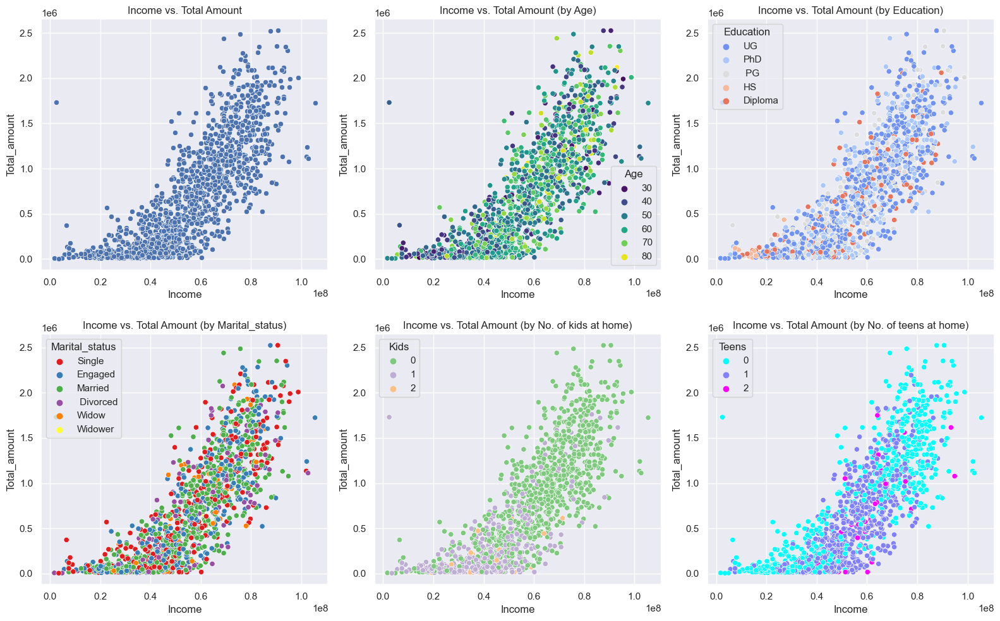

In [435]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(16, 10))

# Scatter plot for 'Income' vs. 'Total_amount'
sns.scatterplot(x='Income', y='Total_amount', data=df, ax=axes[0, 0])
axes[0, 0].set(xlabel='Income', ylabel='Total_amount')
axes[0, 0].set_title('Income vs. Total Amount')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Age'
sns.scatterplot(x='Income', y='Total_amount', hue='Age', data=df, ax=axes[0, 1], palette='viridis')
axes[0, 1].set(xlabel='Income', ylabel='Total_amount')
axes[0, 1].set_title('Income vs. Total Amount (by Age)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Education'
sns.scatterplot(x='Income', y='Total_amount', hue='Education', data=df, ax=axes[0, 2], palette='coolwarm')
axes[0, 2].set(xlabel='Income', ylabel='Total_amount')
axes[0, 2].set_title('Income vs. Total Amount (by Education)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Marital_status'
sns.scatterplot(x='Income', y='Total_amount', hue='Marital_status', data=df, ax=axes[1, 0], palette='Set1')
axes[1, 0].set(xlabel='Income', ylabel='Total_amount')
axes[1, 0].set_title('Income vs. Total Amount (by Marital_status)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Kids'
sns.scatterplot(x='Income', y='Total_amount', hue='Kids', data=df, ax=axes[1, 1], palette='Accent')
axes[1, 1].set(xlabel='Income', ylabel='Total_amount')
axes[1, 1].set_title('Income vs. Total Amount (by No. of kids at home)')

# Scatter plot for 'Income' vs. 'Total_amount' colored by 'Teens'
sns.scatterplot(x='Income', y='Total_amount', hue='Teens', data=df, ax=axes[1, 2], palette='cool')
axes[1, 2].set(xlabel='Income', ylabel='Total_amount')
axes[1, 2].set_title('Income vs. Total Amount (by No. of teens at home)')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

<div class="alert alert-block alert-info">

- Income and Spending Relationship:
There is a positive correlation between customer income and the amount spent on products. In general, higher-income customers tend to spend more.

- Age, Education, and Marital Status:
There is no significant correlation between customer age, education status, or marital status and their spending. These factors do not seem to strongly influence spending patterns.

- Number of Kids:
The number of kids in a customer's household appears to have an impact on spending.
Customers with 0 kids tend to spend more, while those with 1 kid spend less.
The number of customers with 2 kids is low, but their spending pattern tends to be lower.

- Number of Teens:
The presence of teenagers in a customer's household also affects spending.
Customers with 0 teens tend to either spend very little or spend significantly more.
Customers with 1 or 2 teens tend to have moderate spending patterns.

</div>

### Household Composition EDA

- Investigate the relationship between the number of children/teenagers in the household (Kidhome, Teenhome) and spending patterns.
- Analyze if household composition influences campaign acceptance.

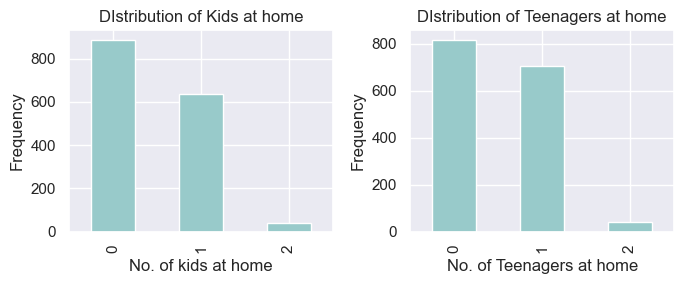

In [436]:
# Create a 2x3 grid of subplots
fig, axes = plt.subplots(1, 2, figsize=(7, 3))

df['Kids'].value_counts().plot(kind='bar', color='#98caca', ax=axes[0])
axes[0].set(xlabel='No. of kids at home', ylabel='Frequency')
axes[0].set_title('DIstribution of Kids at home')

df['Teens'].value_counts().plot(kind='bar', color='#98caca', ax=axes[1])
axes[1].set(xlabel='No. of Teenagers at home', ylabel='Frequency')
axes[1].set_title('DIstribution of Teenagers at home')

plt.tight_layout()

plt.show()

<Figure size 300x300 with 0 Axes>

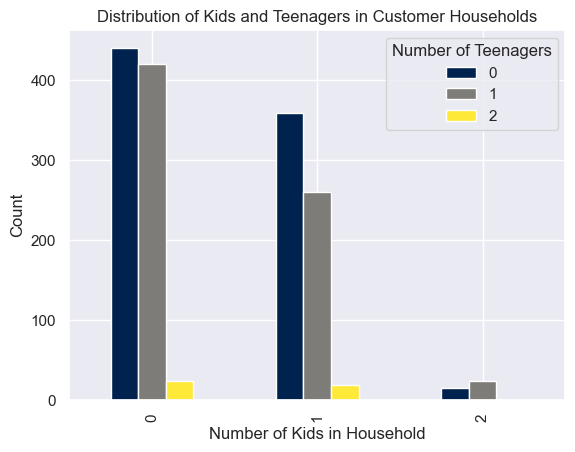

In [437]:
counts = df.groupby(['Kids', 'Teens']).size().unstack()

plt.figure(figsize=(3,3))
counts.plot(kind='bar', cmap='cividis')

plt.title('Distribution of Kids and Teenagers in Customer Households')
plt.xlabel('Number of Kids in Household')
plt.ylabel('Count')
plt.legend(title='Number of Teenagers')

plt.show()

<Figure size 300x300 with 0 Axes>

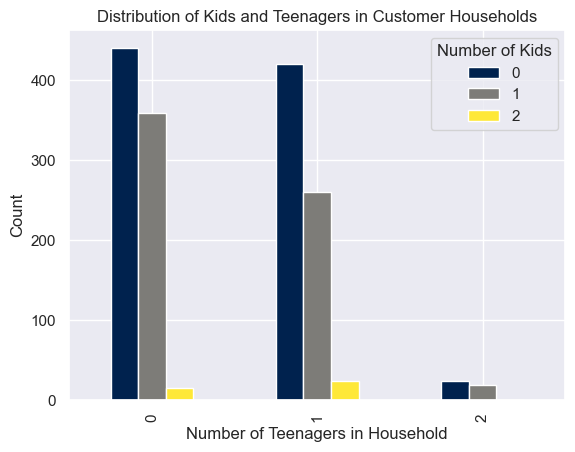

In [438]:
counts = df.groupby(['Teens', 'Kids']).size().unstack()

plt.figure(figsize=(3,3))
counts.plot(kind='bar', cmap='cividis')

plt.title('Distribution of Kids and Teenagers in Customer Households')
plt.xlabel('Number of Teenagers in Household')
plt.ylabel('Count')
plt.legend(title='Number of Kids')

plt.show()

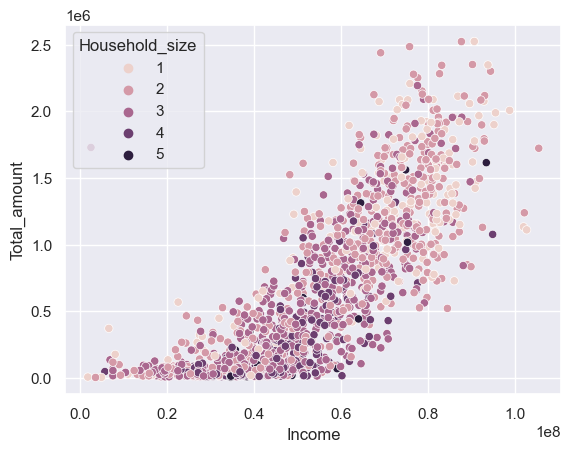

In [439]:
sns.scatterplot(x='Income', y='Total_amount', data=df, hue='Household_size')
plt.show()

In [440]:
household_size = df['Household_size'].unique()
df_cmp_acceptance2 = pd.DataFrame(columns=['Household_size', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Customer_Count'])

result_list = []

for i in household_size:
    # Initialize a dictionary to store the acceptance of each campaign and customer count
    cmp_dict = {'Household_size': i}
    
    # Calculate count of acceptance for each campaign
    for cmp in cmps:
        value_counts_result = df.loc[df['Household_size'] == i, cmp].value_counts()
        count_for_1 = value_counts_result.get(1, 0)
        cmp_dict[cmp] = count_for_1
    
    # Calculate the count of customers in this household size category
    customer_count = len(df[df['Household_size'] == i])
    cmp_dict['Customer_Count'] = customer_count
    
    # Append the count for this campaign and customer count to the result list
    result_list.append(cmp_dict)

# Create a DataFrame from the list of dictionaries
df_cmp_acceptance2 = pd.DataFrame(result_list)

df_cmp_acceptance2


,Household_size,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Customer_Count
0,1,30,5,15,24,27,70,178
1,3,16,5,42,37,10,65,616
2,2,48,7,38,43,64,76,526
3,4,2,1,16,14,1,17,218
4,5,1,0,0,1,1,1,24


<div class="alert alert-block alert-info">

- For customers with a household size of 1, campaign acceptance varies, with the highest acceptance for Campaign 5 (27) and the lowest for Campaign 2 (5). The overall response for the final campaign (Response) is 70. The customer count in this category is 178.

- Customers with a household size of 3 show diverse campaign acceptance patterns. Campaign 3 has the highest acceptance (42), while Campaign 5 has the lowest (10). The response for the final campaign is 65. This category has a larger customer count, with 616 customers.

- In households with a size of 2, campaign acceptance is relatively consistent across campaigns, with the highest being Campaign 1 (48) and the lowest being Campaign 2 (7). The response for the final campaign is 76. There are 526 customers in this category.

- Households with 4 members show lower campaign acceptance overall, with Campaign 3 having the highest (16) and Campaigns 2 and 5 having the lowest (1 each). The response for the final campaign is 17. There are 218 customers in this category.

- The smallest household size category (size 5) has minimal campaign acceptance, with Campaigns 1, 2, 3, and 5 having only one acceptance each. The response for the final campaign is 1. This category has the lowest customer count with 24 customers.


</div>

### Purchase Channels

- Which channel (NumWebPurchases, NumCatalogPurchases, NumStorePurchases) is the most popular among customers?
- Are there any trends in the number of web visits per month (NumWebVisitsMonth)?

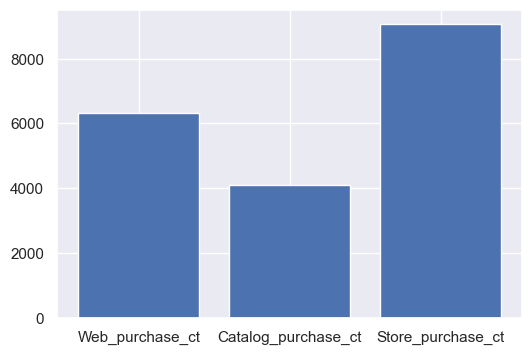

In [441]:
plt.figure(figsize=(6,4))

x = ['Web_purchase_ct', 'Catalog_purchase_ct', 'Store_purchase_ct']
plt.bar(x, [df[i].sum() for i in x])

plt.show()

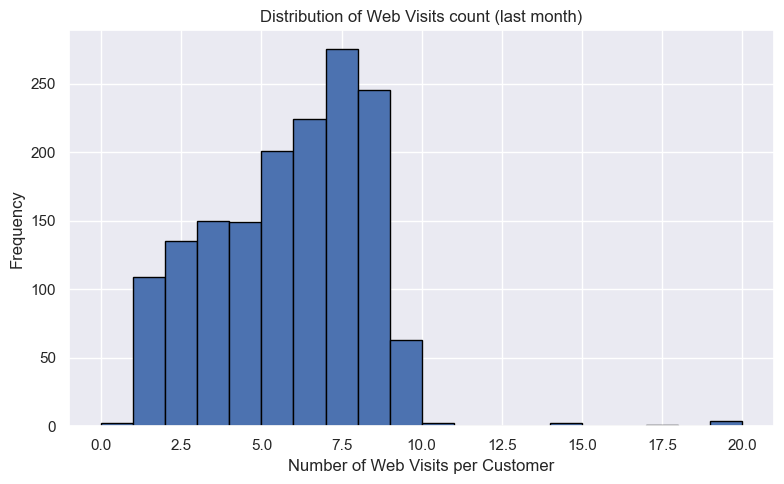

In [442]:
plt.figure(figsize=(8, 5))

plt.hist(df['Web_visits_ct (last_month)'], bins=20, edgecolor='black')

plt.xlabel('Number of Web Visits per Customer')
plt.ylabel('Frequency')
plt.title('Distribution of Web Visits count (last month)')


plt.grid(True)
plt.tight_layout()

plt.show()

### Campaign Response EDA

- How many customers accepted each of the five different marketing campaigns?
- How many customers responded positively to the last campaign (Response)?
- Is there any correlation between campaign acceptance and other customer attributes?

In [443]:
campaigns = ['Campaign 1', 'Campaign 2', 'Campaign 3', 'Campaign 4', 'Campaign 5', 'Last Campaign']
cols_to_count = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']
counts = []

for col in cols_to_count:
    counts.append(df.loc[df[col] == 1, col].value_counts())
    
my_dict = {campaigns[i]: counts[i] for i in range(len(campaigns))}
    
df_campaign = pd.DataFrame(my_dict).T.rename(columns={1: 'Count'})
df_campaign

,Count
Campaign 1,97
Campaign 2,18
Campaign 3,111
Campaign 4,119
Campaign 5,103
Last Campaign,229


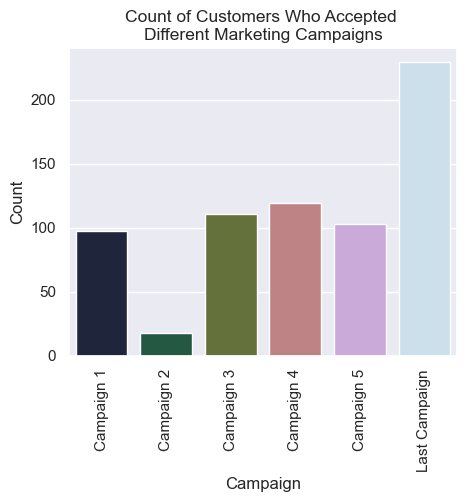

In [444]:
plt.figure(figsize=(5, 4), dpi=100)
sns.barplot(x=df_campaign.index, 
            y="Count",  
            data=df_campaign,
            palette='cubehelix')

plt.xlabel("Campaign")
plt.ylabel("Count")
plt.title("Count of Customers Who Accepted \nDifferent Marketing Campaigns", fontsize=12.5)
plt.xticks(rotation=90)

plt.show()

In [445]:
i = df.loc[df['Response'] == 1, 'Response'].value_counts().iloc[0]
print(f"Count of customers who responded positively to the last campaign: {i}")

Count of customers who responded positively to the last campaign: 229


Effect of different campaigns on each products by various customer features


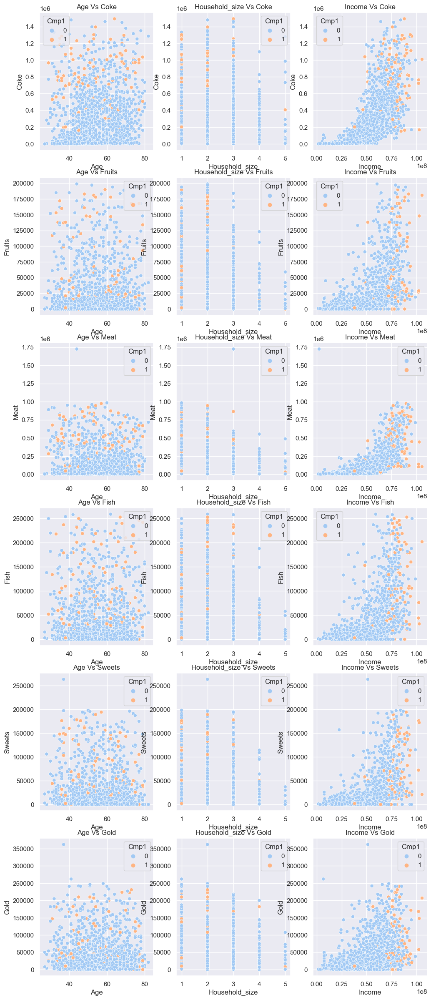

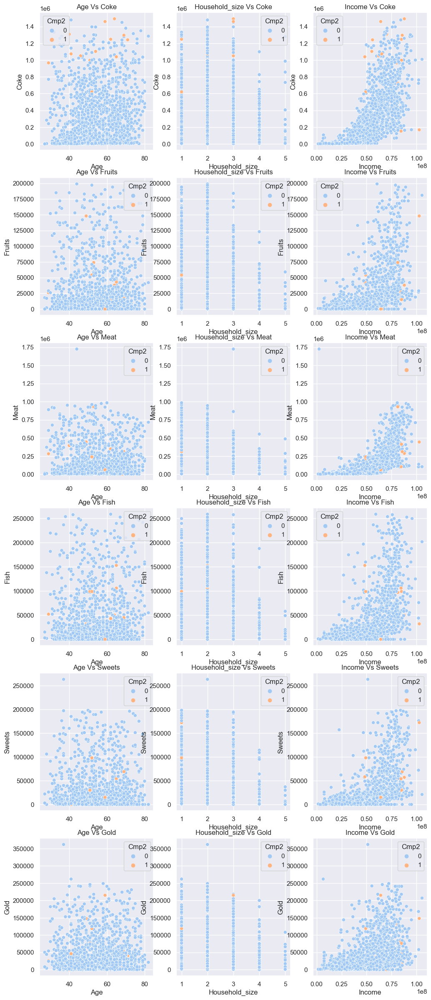

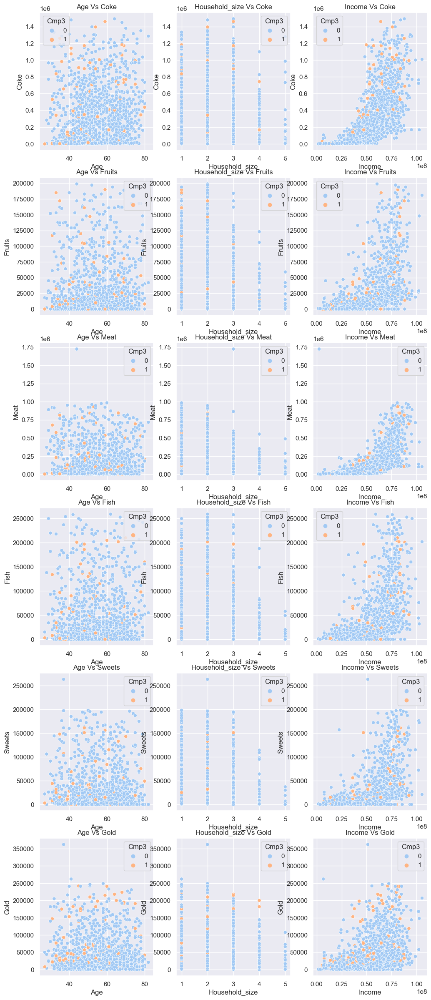

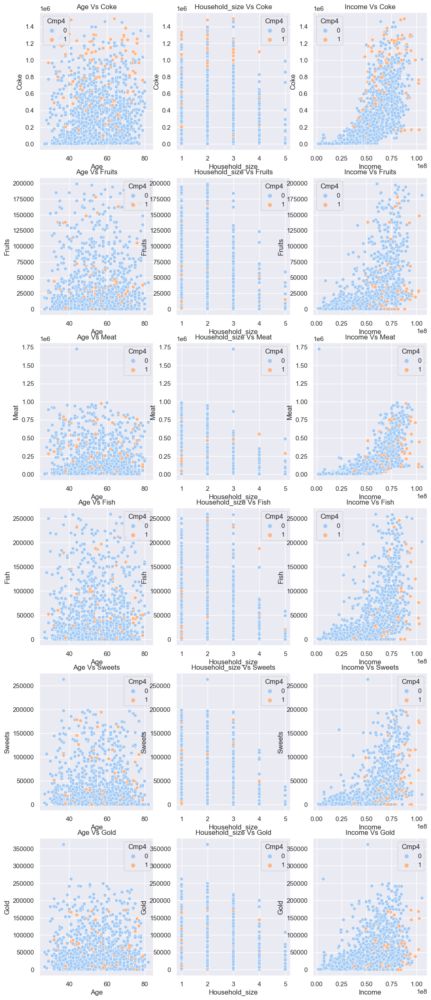

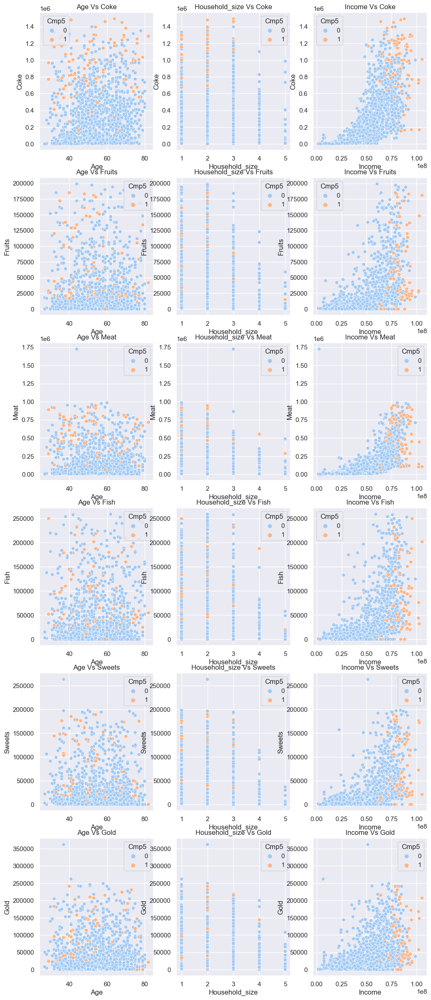

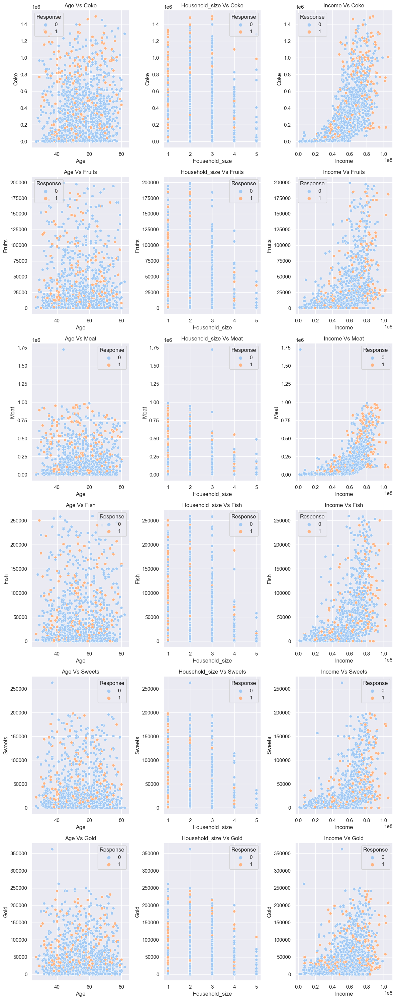

In [446]:
print("Effect of different campaigns on each products by various customer features")
cust_features = ['Age', 'Household_size', 'Income']
prods = ['Coke', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']
cmps = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']

for cmp in cmps:
    # Create a 6x6 grid of subplots
    fig, axes = plt.subplots(6, 3, figsize=(12, 30))
    for feature in cust_features:
        for prod in prods:
            sns.scatterplot(x=feature, 
                            y=prod, 
                            hue=cmp, 
                            data=df, 
                            palette='pastel', 
                            ax=axes[prods.index(prod), cust_features.index(feature)])
            axes[prods.index(prod), cust_features.index(feature)].set_title(f'{feature} Vs {prod}')


# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

<div class="alert alert-block alert-info">
    
- A series of scatterplots show the impact of different campaigns on product acceptance by various customer attributes, such as Age, Household Size, and Income.
    
- For Campaigns 3, 4, and the last campaign (Response), customers from various income levels have accepted them.
In contrast, other campaigns (Cmp1, Cmp2, Cmp5) appear to be predominantly accepted by high-income customers.
    
- The effect of campaigns on product acceptance varies depending on customer features, demonstrating different patterns of acceptance based on Age, Household Size, and Income.

</div>

### Customer Complaint EDA

- Investigate the relationship between customer complaints (Complain) and other customer attributes, such as income or education.

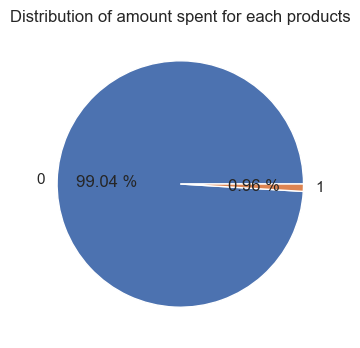

In [447]:
plt.figure(figsize=(4, 4))
count = df['Complain'].value_counts()

plt.pie(count, labels=df['Complain'].value_counts().index, autopct='%.2f %%')
plt.title("Distribution of amount spent for each products")
plt.show()

### Encoding

In [448]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_encoded =df.copy()

cols_to_encode = ['Education', 'Marital_status']
for col in cols_to_encode:
    df_encoded[col] = label_encoder.fit_transform(df[col])
    
df_encoded.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size,Age,Total_amount
0,4,3,58138000.0,0,0,2012-09-04,58,635000,88000,546000,172000,88000,88000,3,8,10,4,7,0,0,0,0,0,0,1,1,66,1617000
1,4,3,46344000.0,1,1,2014-03-08,38,11000,1000,6000,2000,1000,6000,2,1,1,2,5,0,0,0,0,0,0,0,3,69,27000
2,4,1,71613000.0,0,0,2013-08-21,26,426000,49000,127000,111000,21000,42000,1,8,2,10,4,0,0,0,0,0,0,0,2,58,776000
3,4,1,26646000.0,1,0,2014-02-10,26,11000,4000,20000,10000,3000,5000,2,2,0,4,6,0,0,0,0,0,0,0,3,39,53000
4,3,2,58293000.0,1,0,2014-01-19,94,173000,43000,118000,46000,27000,15000,5,5,3,6,5,0,0,0,0,0,0,0,3,42,422000


In [449]:
df_encoded['Education'] = pd.to_numeric(df_encoded['Education'])
df_encoded['Marital_status'] = pd.to_numeric(df_encoded['Marital_status'])

### Correlation Analysis

In [450]:
df_encoded.columns

Index(['Education', 'Marital_status', 'Income', 'Kids', 'Teens',
       'Enrollment_date', 'Recency', 'Coke', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'Purchase_ct_with_deals', 'Web_purchase_ct',
       'Catalog_purchase_ct', 'Store_purchase_ct',
       'Web_visits_ct (last_month)', 'Cmp3', 'Cmp4', 'Cmp5', 'Cmp1', 'Cmp2',
       'Complain', 'Response', 'Household_size', 'Age', 'Total_amount'],
      dtype='object')

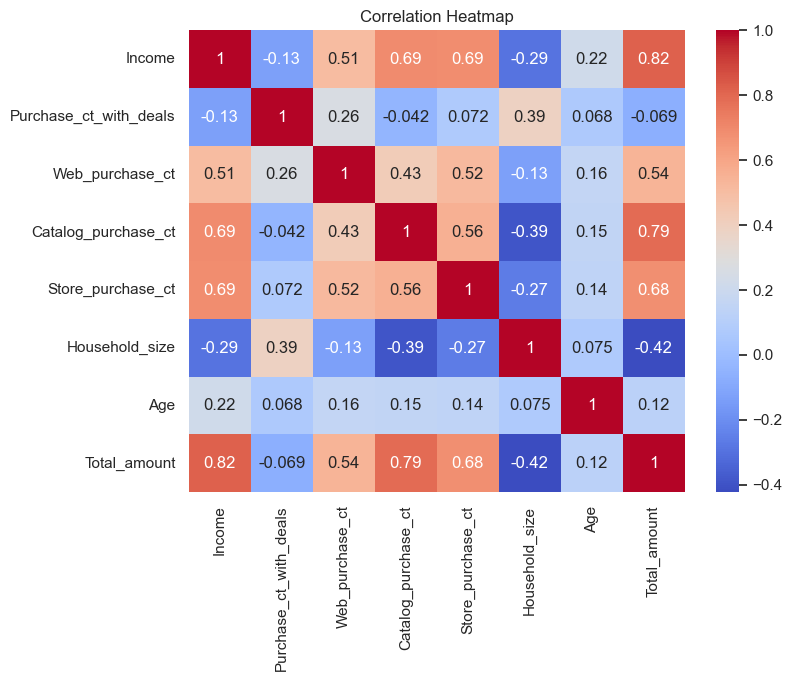

In [451]:
df_corr = df_encoded[['Income', 'Purchase_ct_with_deals',
       'Web_purchase_ct', 'Catalog_purchase_ct', 'Store_purchase_ct',
       'Response', 'Household_size', 'Age', 'Total_amount']]
corr =df_corr.drop('Response', axis=1).corr()

plt.figure(figsize=(8, 6)) 
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

C:\Users\sreej\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


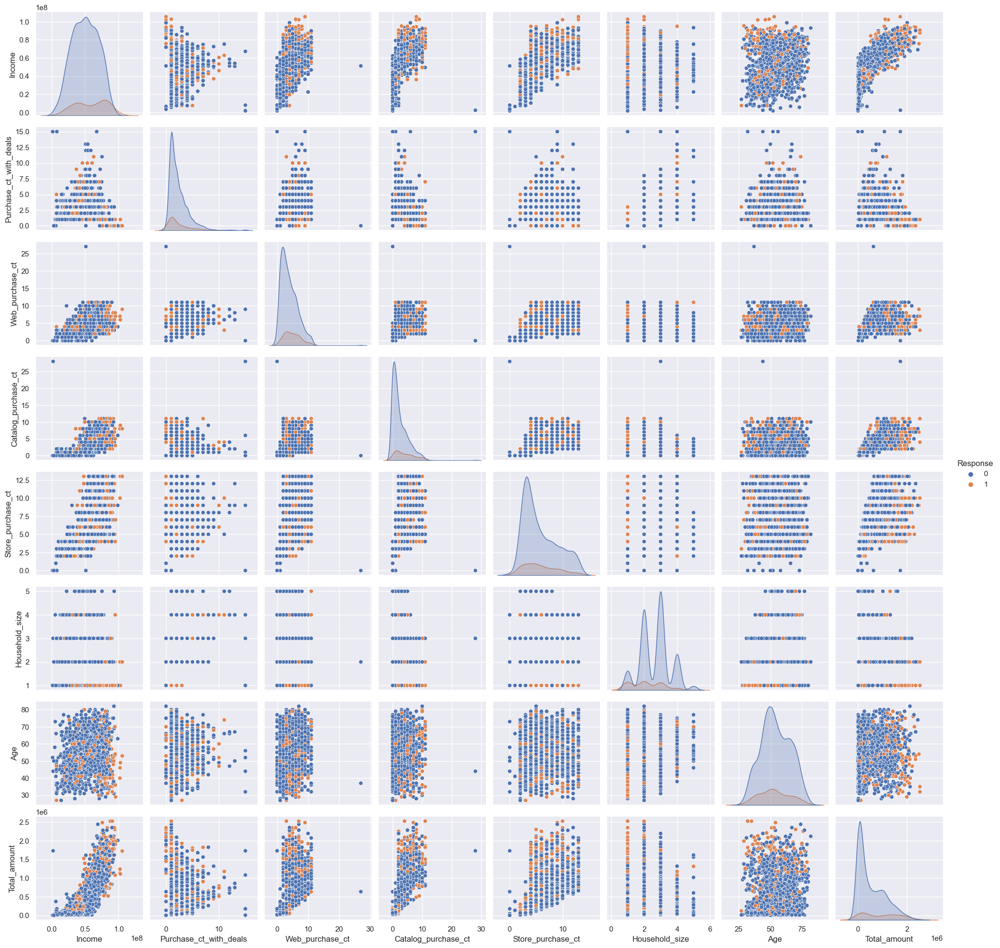

In [452]:
sns.pairplot(df_corr, diag_kind='kde', hue='Response')
plt.show()

### Feature Scaling

In [453]:
from sklearn.preprocessing import StandardScaler
df_scaled = df_encoded.copy()

scaler = StandardScaler()

for col in df_encoded:
    scaler.fit(df_encoded[[col]])
    df_scaled.loc[:, col] = scaler.transform(df_encoded[[col]])
    
df_scaled.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size,Age,Total_amount
0,0.788424,1.172489,0.324298,-0.838315,-0.916510,-1.541217,0.323965,0.982823,1.578929,1.776073,2.505388,1.461671,0.891719,0.339549,1.476822,2.640291,-0.557915,0.671956,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,2.412667,-1.753903,1.026783,1.704007
1,0.788424,1.172489,-0.254872,0.993081,0.897924,1.196083,-0.367054,-0.869594,-0.629027,-0.725258,-0.641412,-0.623117,-0.727777,-0.181448,-1.140713,-0.578336,-1.177511,-0.146761,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,1.284718,-0.956910
2,0.788424,-0.820359,0.986017,-0.838315,-0.916510,0.205678,-0.781665,0.362382,0.589156,-0.164774,1.376242,-0.143855,-0.016779,-0.702445,1.476822,-0.220711,1.300875,-0.556120,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,-0.661560,0.338958,0.296566
3,0.788424,-0.820359,-1.222184,0.993081,-0.916510,1.066684,-0.781665,-0.869594,-0.552891,-0.660409,-0.493327,-0.575191,-0.747526,-0.181448,-0.766779,-0.935962,-0.557915,0.262597,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,-1.294626,-0.913399
4,0.134752,0.176065,0.331909,0.993081,-0.916510,0.957192,1.567799,-0.388678,0.436883,-0.206463,0.173054,-0.000077,-0.550027,1.381543,0.355021,0.136914,0.061682,-0.146761,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,-1.036691,-0.295865


## Clustering

In [454]:
df_cluster = df_scaled[['Education', 'Marital_status', 'Income', 'Kids', 'Teens', 'Coke',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Purchase_ct_with_deals',
       'Web_purchase_ct', 'Catalog_purchase_ct', 'Store_purchase_ct',
       'Complain',  'Household_size', 'Age', 'Total_amount']].copy()

df_cluster.head()

,Education,Marital_status,Income,Kids,Teens,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Complain,Household_size,Age,Total_amount
0,0.788424,1.172489,0.324298,-0.838315,-0.916510,0.982823,1.578929,1.776073,2.505388,1.461671,0.891719,0.339549,1.476822,2.640291,-0.557915,-0.098469,-1.753903,1.026783,1.704007
1,0.788424,1.172489,-0.254872,0.993081,0.897924,-0.869594,-0.629027,-0.725258,-0.641412,-0.623117,-0.727777,-0.181448,-1.140713,-0.578336,-1.177511,-0.098469,0.430783,1.284718,-0.956910
2,0.788424,-0.820359,0.986017,-0.838315,-0.916510,0.362382,0.589156,-0.164774,1.376242,-0.143855,-0.016779,-0.702445,1.476822,-0.220711,1.300875,-0.098469,-0.661560,0.338958,0.296566
3,0.788424,-0.820359,-1.222184,0.993081,-0.916510,-0.869594,-0.552891,-0.660409,-0.493327,-0.575191,-0.747526,-0.181448,-0.766779,-0.935962,-0.557915,-0.098469,0.430783,-1.294626,-0.913399
4,0.134752,0.176065,0.331909,0.993081,-0.916510,-0.388678,0.436883,-0.206463,0.173054,-0.000077,-0.550027,1.381543,0.355021,0.136914,0.061682,-0.098469,0.430783,-1.036691,-0.295865


### Dimensionality Reduction

#### PCA

In [455]:
from sklearn.decomposition import PCA

n = df_cluster.shape[1]
n

19

In [456]:
pca = PCA(n_components=n, random_state=1)
df_pca = pd.DataFrame(pca.fit_transform(df_cluster))

In [457]:
exp_var = pca.explained_variance_ratio_
for i in range(n):
    print(exp_var[i])

0.3771329962374578
0.11728324443106744
0.062072174742297384
0.05434796530431437
0.05352629245054448
0.051537235497255376
0.04495036950263261
0.04057896314370127
0.032558272016861
0.030980621640729598
0.025320692581357145
0.023054146803341953
0.02136194946408623
0.020519621542003638
0.015045867601865002
0.013486354695294049
0.01008710944346206
0.0061561229017286865
1.9463089456503846e-33


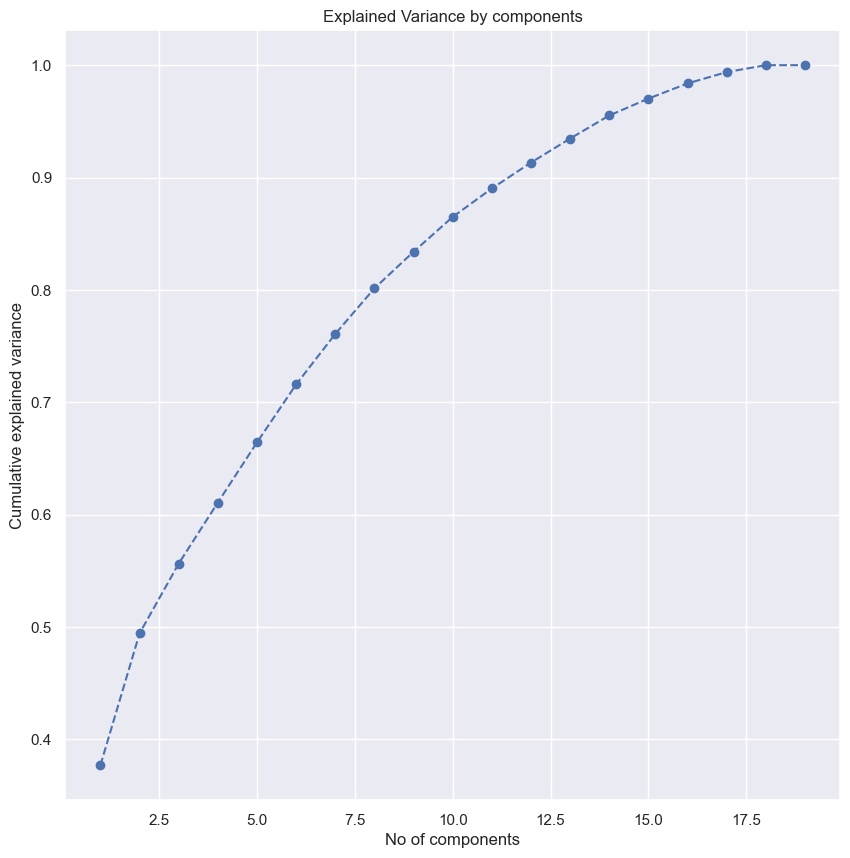

In [458]:
plt.figure(figsize=(10,10))
plt.plot(range(1, n+1), exp_var.cumsum(), marker='o', linestyle='--')
plt.title("Explained Variance by components")
plt.xlabel("No of components")
plt.ylabel("Cumulative explained variance")
plt.show()

In [459]:
sum = 0
for ix, i in enumerate(exp_var):
    sum += i
    if (sum>0.90):
        print("No of PCs that explain atleast 90% of variance:", ix+1)
        break

No of PCs that explain atleast 90% of variance: 12


#### T-SEN

In [460]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=45, random_state=1)
df_tsne = tsne.fit_transform(df_cluster)
    
df_tsne

array([[ 38.969543, -10.449158],
       [-26.079596,  23.29568 ],
       [ 20.582275, -16.105143],
       ...,
       [-17.738602, -20.729408],
       [-27.066269,  -5.192289],
       [-31.017435, -15.760653]], dtype=float32)

In [461]:
df_tsne.shape

(1562, 2)

In [462]:
df_tsne = pd.DataFrame(data=df_tsne, columns=['component 1', 'component 2'])
df_tsne.head()

,component 1,component 2
0,38.969543,-10.449158
1,-26.079596,23.295679
2,20.582275,-16.105143
3,-33.777676,-6.724848
4,-22.808821,-3.239935


### Hierarchical Clustering

#### Dendrogram

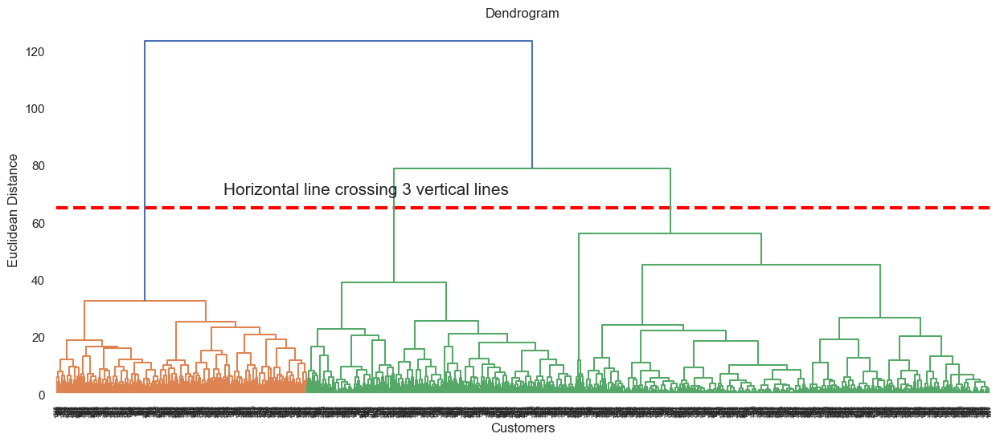

In [463]:
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(15,6))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean Distance')

plt.hlines(y=65, xmin=0, xmax=20000, lw=3, linestyle='--', color='red')
plt.text(x=2800, y=70, s="Horizontal line crossing 3 vertical lines", fontsize=15)

dendrogram = sch.dendrogram(sch.linkage(df_cluster, method='ward'))
plt.show()

In [464]:
from sklearn.cluster import AgglomerativeClustering

hc=AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='ward')
df_tsne['y_hc']=hc.fit_predict(df_tsne)

C:\Users\sreej\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


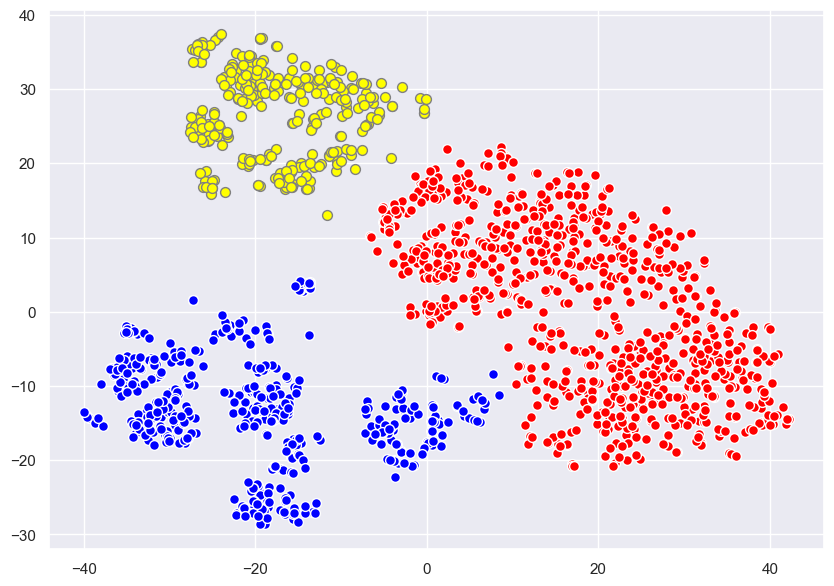

In [465]:
plt.figure(figsize=(10,7))

plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 0, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 0, 'component 2'], s=50, c='red', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 1, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 1, 'component 2'], s=50, c='blue', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_hc'] == 2, 'component 1'], df_tsne.loc[df_tsne['y_hc'] == 2, 'component 2'], s=50, c='yellow', edgecolors="grey")

plt.show()

In [466]:
from sklearn.metrics import silhouette_samples, silhouette_score

silhouette_avg = silhouette_score(df_tsne.iloc[:, [0,1]], df_tsne['y_hc'])
silhouette_avg

0.51585406

### K Means

In [467]:
from sklearn.cluster import KMeans

In [468]:
wcss = []     
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, n_init='auto', init='k-means++', random_state=0)
    kmeans.fit(df_tsne)
    wcss.append(kmeans.inertia_)

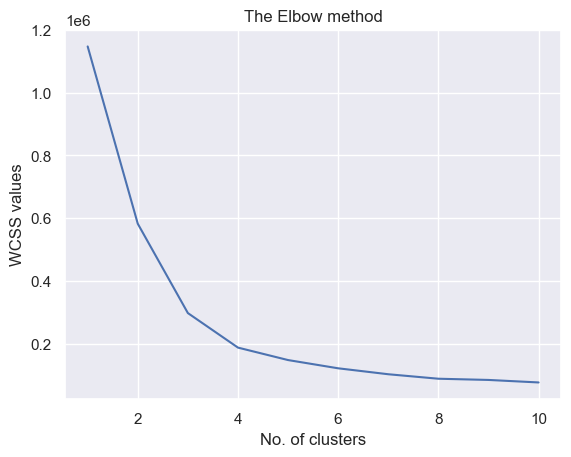

In [469]:
plt.plot(range(1,11), wcss)
plt.title('The Elbow method')
plt.xlabel('No. of clusters')
plt.ylabel('WCSS values')
plt.show()

In [470]:
km = KMeans(n_clusters = 4)
y_predicted = km.fit_predict(df_tsne)
y_predicted

C:\Users\sreej\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


array([1, 0, 1, ..., 2, 2, 2])

In [471]:
df_tsne.loc[:, 'y_km'] = y_predicted
df_tsne.head()

,component 1,component 2,y_hc,y_km
0,38.969543,-10.449158,0,1
1,-26.079596,23.295679,2,0
2,20.582275,-16.105143,0,1
3,-33.777676,-6.724848,1,2
4,-22.808821,-3.239935,1,2


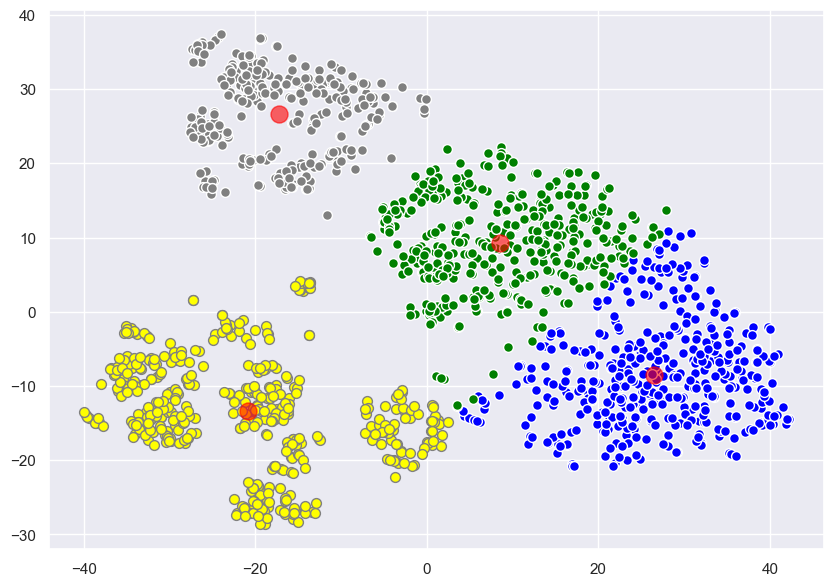

In [472]:
plt.figure(figsize=(10,7))


plt.scatter(df_tsne.loc[df_tsne['y_km'] == 0, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 0, 'component 2'], s=50, c='grey', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 1, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 1, 'component 2'], s=50, c='blue', edgecolors="white")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 2, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 2, 'component 2'], s=50, c='yellow', edgecolors="grey")
plt.scatter(df_tsne.loc[df_tsne['y_km'] == 3, 'component 1'], df_tsne.loc[df_tsne['y_km'] == 3, 'component 2'], s=50, c='green', edgecolors="white")

plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], s=150, c='red', label='Centroids', alpha=.60)

plt.show()

In [473]:
from sklearn.metrics import silhouette_samples, silhouette_score
silhouette_avg = silhouette_score(df_tsne.iloc[:, [0,1]], df_tsne['y_km'])
silhouette_avg

0.5209578

<div class="alert alert-block alert-info">
KMeans clustering has highest Silhouette score
</div>

In [474]:
df_scaled['Predicted_cluster'] = y_predicted

## Interpretation and analysis of clusters

In [475]:
df_scaled.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size,Age,Total_amount,Predicted_cluster
0,0.788424,1.172489,0.324298,-0.838315,-0.916510,-1.541217,0.323965,0.982823,1.578929,1.776073,2.505388,1.461671,0.891719,0.339549,1.476822,2.640291,-0.557915,0.671956,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,2.412667,-1.753903,1.026783,1.704007,1
1,0.788424,1.172489,-0.254872,0.993081,0.897924,1.196083,-0.367054,-0.869594,-0.629027,-0.725258,-0.641412,-0.623117,-0.727777,-0.181448,-1.140713,-0.578336,-1.177511,-0.146761,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,1.284718,-0.956910,0
2,0.788424,-0.820359,0.986017,-0.838315,-0.916510,0.205678,-0.781665,0.362382,0.589156,-0.164774,1.376242,-0.143855,-0.016779,-0.702445,1.476822,-0.220711,1.300875,-0.556120,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,-0.661560,0.338958,0.296566,1
3,0.788424,-0.820359,-1.222184,0.993081,-0.916510,1.066684,-0.781665,-0.869594,-0.552891,-0.660409,-0.493327,-0.575191,-0.747526,-0.181448,-0.766779,-0.935962,-0.557915,0.262597,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,-1.294626,-0.913399,2
4,0.134752,0.176065,0.331909,0.993081,-0.916510,0.957192,1.567799,-0.388678,0.436883,-0.206463,0.173054,-0.000077,-0.550027,1.381543,0.355021,0.136914,0.061682,-0.146761,-0.276584,-0.287171,-0.2657,-0.257316,-0.107972,-0.098469,-0.414479,0.430783,-1.036691,-0.295865,2


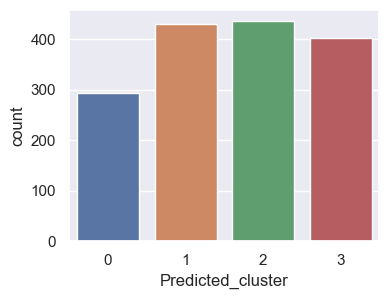

In [476]:
plt.figure(figsize=(4, 3))
sns.countplot(x=df_scaled['Predicted_cluster'])
plt.show()

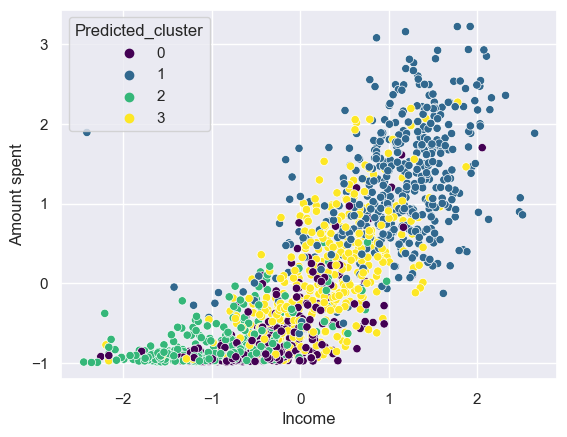

In [477]:
sns.scatterplot(x=df_scaled['Income'], 
                y=df_scaled['Total_amount'], 
                hue=df_scaled['Predicted_cluster'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

<div class="alert alert-block alert-info">

- cluster 0: Middle income, avg spenders
- cluster 1: low income low spenders
- cluster 2: average income low spenders
- cluster 3: high income high spenders

</div>

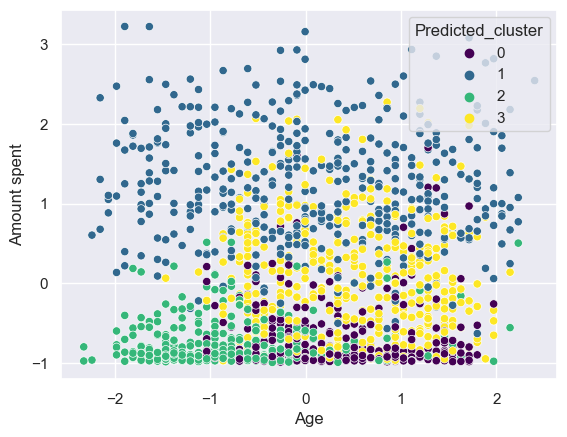

In [478]:
sns.scatterplot(x=df_scaled['Age'], 
                y=df_scaled['Total_amount'], 
                hue=df_scaled['Predicted_cluster'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

<div class="alert alert-block alert-info">

- cluster 0: Mid to old age
- cluster 1: young
- cluster 2: mid to old age
- cluster 3: spans across all age

</div>

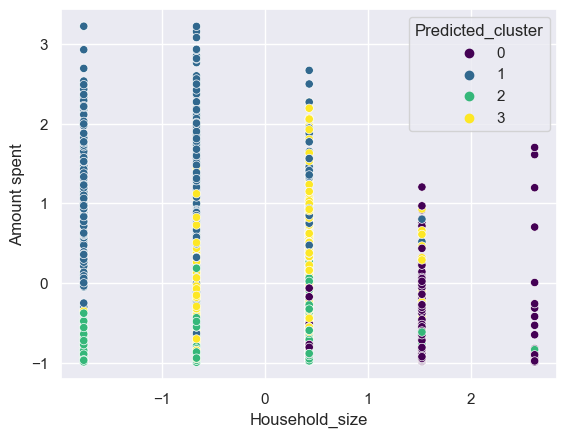

In [479]:
sns.scatterplot(x=df_scaled['Household_size'], 
                y=df_scaled['Total_amount'], 
                hue=df_scaled['Predicted_cluster'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

<div class="alert alert-block alert-info">

- cluster 0: average household size
- cluster 1: low to average household size
- cluster 2: average to high household size, majority lies in the high side
- cluster 3: majority low, but some have average house hold size

</div>

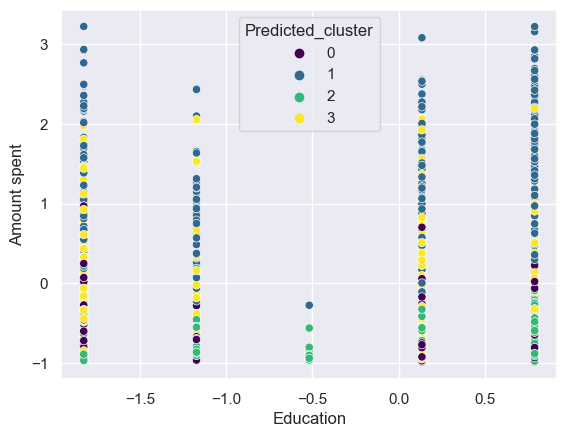

In [480]:
sns.scatterplot(x=df_scaled['Education'], 
                y=df_scaled['Total_amount'], 
                hue=df_scaled['Predicted_cluster'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

<div class="alert alert-block alert-info">

mixed, except for highschoolers who comes under cluster 0, 1 and 2 only

</div>

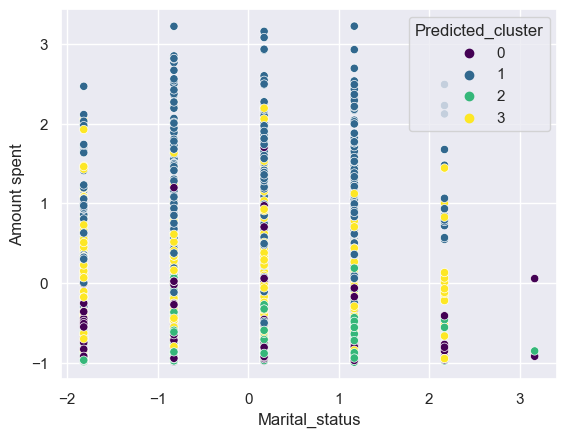

In [481]:
sns.scatterplot(x=df_scaled['Marital_status'], 
                y=df_scaled['Total_amount'], 
                hue=df_scaled['Predicted_cluster'],
               palette='viridis')
plt.ylabel('Amount spent')

plt.show()

<div class="alert alert-block alert-info">

mixed, except for widowers who comes under cluster 1 and 2 only

</div>

C:\Users\sreej\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


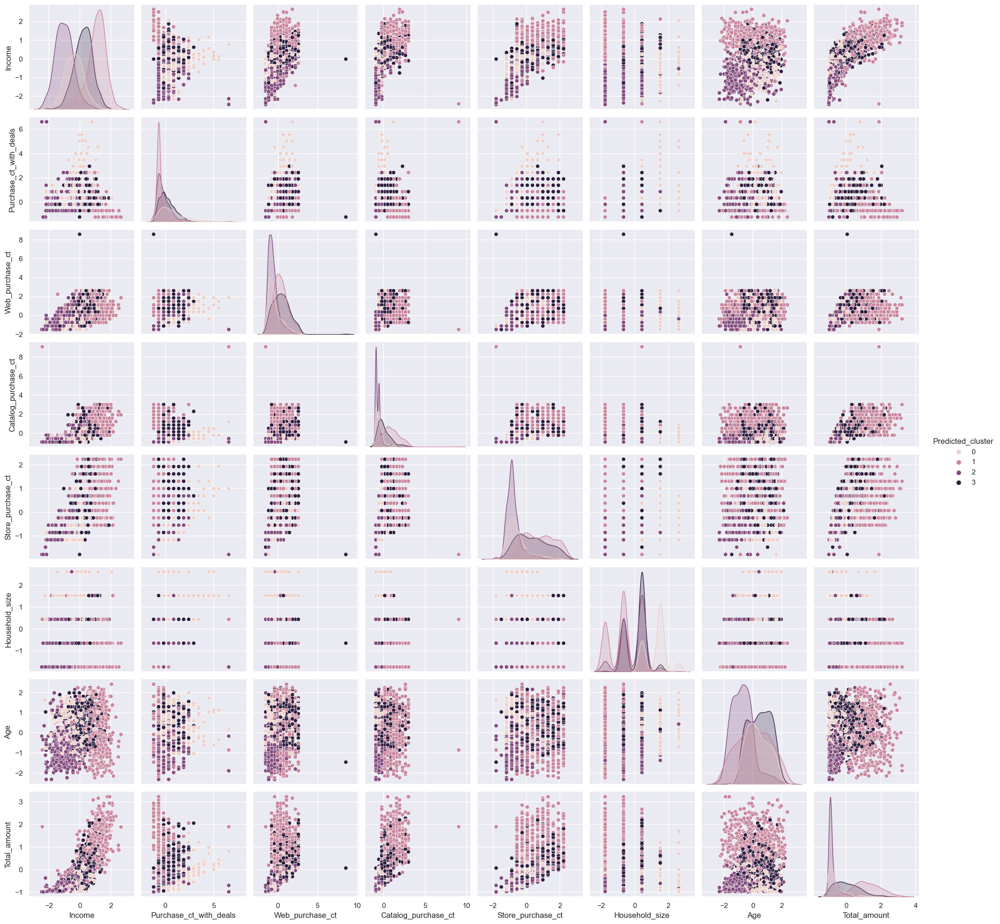

In [482]:
df_1 = df_scaled[['Income', 'Purchase_ct_with_deals',
       'Web_purchase_ct', 'Catalog_purchase_ct', 'Store_purchase_ct',
       'Household_size', 'Age', 'Total_amount', 'Predicted_cluster']]
sns.pairplot(df_1, diag_kind='kde', hue='Predicted_cluster')
plt.show()

In [483]:
original_data = pd.DataFrame(scaler.inverse_transform(df_scaled), columns=df_scaled.columns)
original_data['Response'] = df['Response']
original_data['Predicted_cluster'] = df_scaled['Predicted_cluster']

In [484]:
original_data.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Household_size,Age,Total_amount,Predicted_cluster
0,1.069904e+06,1.299398e+06,7.925710e+05,9.786544e+04,5.114093e+04,-3.221456e+05,7.923720e+05,1.186065e+06,1.542261e+06,1.660062e+06,2.095856e+06,1.472195e+06,1.131627e+06,8.016839e+05,1.481248e+06,2.176466e+06,2.654154e+05,1.000310e+06,433520.845098,427195.08988,440024.944595,445034.397486,534273.032201,539951.527177,1.0,-449233.402784,1.212333e+06,1617000.0,1.0
1,1.069904e+06,1.299398e+06,4.464950e+05,1.192194e+06,1.135335e+06,1.313496e+06,3.794619e+05,7.917493e+04,2.229227e+05,1.654212e+05,2.155224e+05,2.264544e+05,1.639163e+05,4.903683e+05,-8.282886e+04,2.532125e+05,-1.048173e+05,5.110953e+05,433520.845098,427195.08988,440024.944595,445034.397486,534273.032201,539951.527177,0.0,856200.070221,1.366459e+06,27000.0,0.0
2,1.069904e+06,1.085946e+05,1.187973e+06,9.786544e+04,5.114093e+04,7.216913e+05,1.317158e+05,8.153280e+05,9.508337e+05,5.003316e+05,1.421148e+06,5.128317e+05,5.887648e+05,1.790527e+05,1.481248e+06,4.669073e+05,1.376113e+06,2.664879e+05,433520.845098,427195.08988,440024.944595,445034.397486,534273.032201,539951.527177,0.0,203483.333718,8.013313e+05,776000.0,1.0
3,1.069904e+06,1.085946e+05,-1.315112e+05,1.192194e+06,5.114093e+04,1.236175e+06,1.317158e+05,7.917493e+04,2.684172e+05,2.041712e+05,3.040087e+05,2.550922e+05,1.521150e+05,4.903683e+05,1.406107e+05,3.951764e+04,2.654154e+05,7.557027e+05,433520.845098,427195.08988,440024.944595,445034.397486,534273.032201,539951.527177,0.0,856200.070221,-1.747977e+05,53000.0,2.0
4,6.793101e+05,7.039960e+05,7.971192e+05,1.192194e+06,5.114093e+04,1.170749e+06,1.535610e+06,3.665407e+05,8.598448e+05,4.754209e+05,7.021970e+05,5.987448e+05,2.701284e+05,1.424315e+06,8.109295e+05,6.806021e+05,6.356480e+05,5.110953e+05,433520.845098,427195.08988,440024.944595,445034.397486,534273.032201,539951.527177,0.0,856200.070221,-2.067203e+04,422000.0,2.0


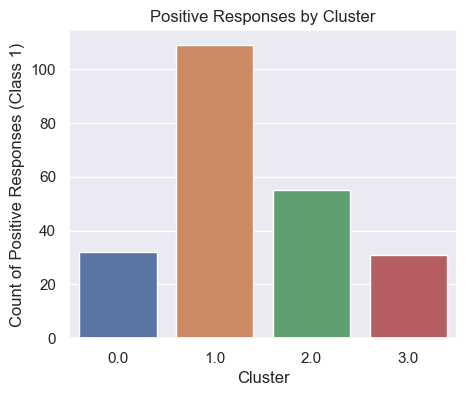

In [485]:
cluster_response_counts = original_data.groupby('Predicted_cluster')['Response'].sum().reset_index()

plt.figure(figsize=(5, 4))
sns.barplot(x='Predicted_cluster', y='Response', data=cluster_response_counts)
plt.xlabel('Cluster')
plt.ylabel('Count of Positive Responses (Class 1)')
plt.title('Positive Responses by Cluster')
plt.show()

In [486]:
data = {
    'Cluster': [0, 1, 2, 3],  # Cluster labels
    'Response_1': [len(original_data.loc[(original_data['Predicted_cluster'] == i) & (original_data['Response'] == 1)]) for i in range(4)],
    'Total': [len(original_data.loc[original_data['Predicted_cluster'] == i]) for i in range(4)]
}

df1 = pd.DataFrame(data)

df1.head()

,Cluster,Response_1,Total
0,0,32,294
1,1,109,427
2,2,55,430
3,3,31,402


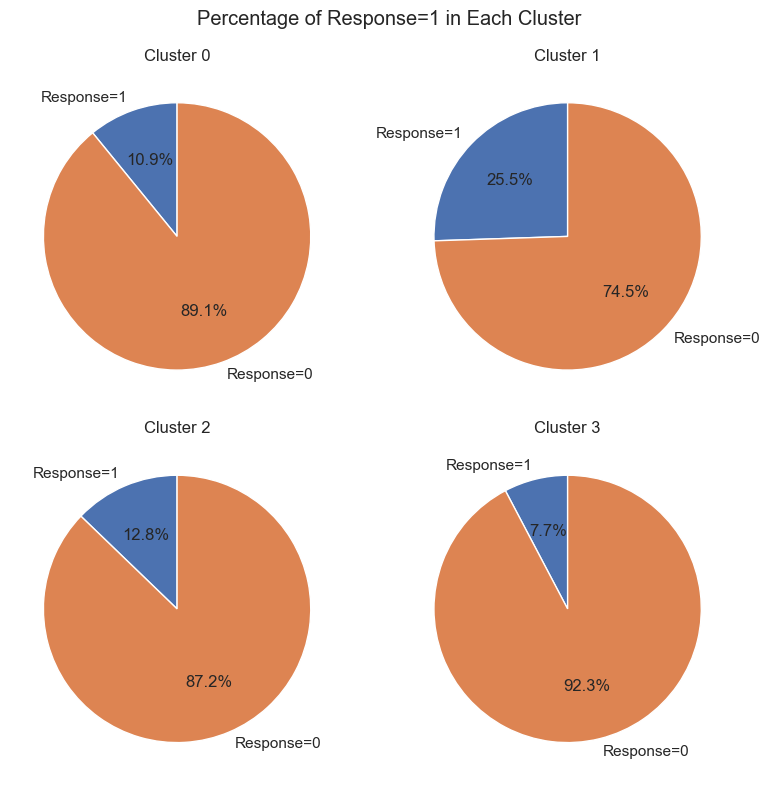

In [487]:
# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(8, 8))
fig.suptitle('Percentage of Response=1 in Each Cluster')

for i in range(4):
    # Calculate the percentage
    percentage = (df1['Response_1'][i] / df1['Total'][i]) * 100

    # Pie chart for each cluster
    axes[i // 2, i % 2].pie([percentage, 100 - percentage], labels=['Response=1', 'Response=0'], autopct='%1.1f%%', startangle=90)
    axes[i // 2, i % 2].set_title(f'Cluster {i}')

plt.tight_layout()
plt.show()

## Classification

### Feature importance

In [488]:
from sklearn.ensemble import RandomForestClassifier

In [489]:
# spliting dataset into dependant and independant variables
x = df_scaled.drop(['Response'], axis=1)
y = df['Response']

In [490]:
model = RandomForestClassifier()
model.fit(x, y)

RandomForestClassifier()

In [491]:
feature_importance = model.feature_importances_

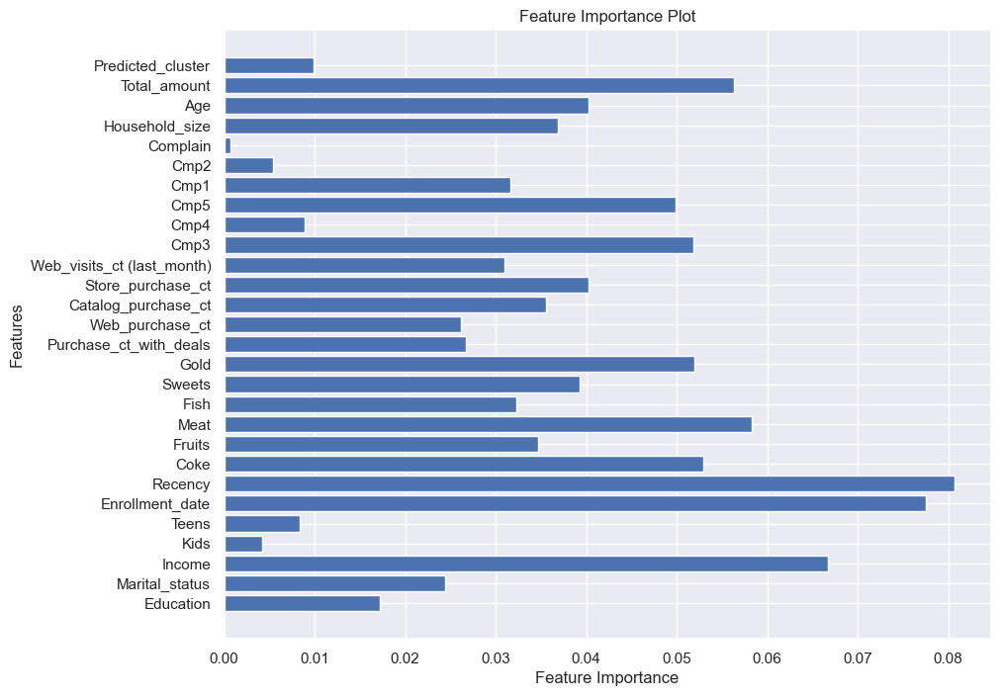

In [492]:
plt.figure(figsize=(10, 8))
plt.barh(x.columns, feature_importance)
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Plot')
plt.show()

In [493]:
df_scaled.columns

Index(['Education', 'Marital_status', 'Income', 'Kids', 'Teens',
       'Enrollment_date', 'Recency', 'Coke', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'Purchase_ct_with_deals', 'Web_purchase_ct',
       'Catalog_purchase_ct', 'Store_purchase_ct',
       'Web_visits_ct (last_month)', 'Cmp3', 'Cmp4', 'Cmp5', 'Cmp1', 'Cmp2',
       'Complain', 'Response', 'Household_size', 'Age', 'Total_amount',
       'Predicted_cluster'],
      dtype='object')

In [494]:
df_class = df_scaled[['Education', 'Marital_status', 'Income', 
        #'Kids', 'Teens',
       'Enrollment_date', 'Recency', 'Coke', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'Purchase_ct_with_deals', 'Web_purchase_ct',
       'Catalog_purchase_ct', 'Store_purchase_ct',
       'Web_visits_ct (last_month)', 'Cmp3', 'Cmp5', 'Cmp1', 
        #'Cmp2', 'Cmp4', 'Complain', 'Predicted_cluster'
        'Household_size', 'Age', 'Total_amount']].copy()

df_class.head()

,Education,Marital_status,Income,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp5,Cmp1,Household_size,Age,Total_amount
0,0.788424,1.172489,0.324298,-1.541217,0.323965,0.982823,1.578929,1.776073,2.505388,1.461671,0.891719,0.339549,1.476822,2.640291,-0.557915,0.671956,-0.276584,-0.2657,-0.257316,-1.753903,1.026783,1.704007
1,0.788424,1.172489,-0.254872,1.196083,-0.367054,-0.869594,-0.629027,-0.725258,-0.641412,-0.623117,-0.727777,-0.181448,-1.140713,-0.578336,-1.177511,-0.146761,-0.276584,-0.2657,-0.257316,0.430783,1.284718,-0.956910
2,0.788424,-0.820359,0.986017,0.205678,-0.781665,0.362382,0.589156,-0.164774,1.376242,-0.143855,-0.016779,-0.702445,1.476822,-0.220711,1.300875,-0.556120,-0.276584,-0.2657,-0.257316,-0.661560,0.338958,0.296566
3,0.788424,-0.820359,-1.222184,1.066684,-0.781665,-0.869594,-0.552891,-0.660409,-0.493327,-0.575191,-0.747526,-0.181448,-0.766779,-0.935962,-0.557915,0.262597,-0.276584,-0.2657,-0.257316,0.430783,-1.294626,-0.913399
4,0.134752,0.176065,0.331909,0.957192,1.567799,-0.388678,0.436883,-0.206463,0.173054,-0.000077,-0.550027,1.381543,0.355021,0.136914,0.061682,-0.146761,-0.276584,-0.2657,-0.257316,0.430783,-1.036691,-0.295865


### DATA PREPROCESSING 

In [504]:
df1 = pd.read_csv('customer_test.csv')
df1.head()

,Unnamed: 0.1,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,1681,1681,5939,1971,S1,Bertunangan,38232000.0,1,1,17-01-2014,84,43000,5000,28000,7000,6000,33000,4,3,1,3,5,0,0,0,0,0,0,3,11,0
1,1682,1682,2156,1955,S3,Menikah,22554000.0,1,1,03-11-2012,38,27000,0,10000,0,0,4000,4,2,0,4,5,0,0,0,0,0,0,3,11,0
2,1683,1683,7788,1983,S3,Menikah,23536000.0,1,0,04-06-2014,53,6000,0,3000,0,0,1000,1,0,0,3,3,0,0,0,0,0,0,3,11,0
3,1684,1684,10323,1952,S1,Menikah,49413000.0,0,1,25-10-2013,88,205000,7000,41000,3000,2000,46000,2,4,2,5,5,0,0,0,0,0,0,3,11,0
4,1685,1685,7947,1969,S1,Menikah,42231000.0,1,1,25-03-2014,99,24000,0,8000,0,1000,4000,1,1,0,3,5,0,0,0,0,0,0,3,11,0


In [505]:
# dropping irrevalent columns
df1 = df1[[#'Unnamed: 0.1', 'Unnamed: 0', 'ID', 
       'Year_Birth', 'Education',
       'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer',
       'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts',
       'MntSweetProducts', 'MntGoldProds', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 
        #'Z_CostContact', 'Z_Revenue', 
       'Response']].copy()
df1.shape

(559, 26)

In [506]:
# converting datatypes of specific columns
df1['Dt_Customer'] = pd.to_datetime(df1['Dt_Customer'], format='%d-%m-%Y')
df1[['Dt_Customer']].head()

,Dt_Customer
0,2014-01-17
1,2012-11-03
2,2014-06-04
3,2013-10-25
4,2014-03-25


In [507]:
# renaming columns
df1 = df1.rename(columns = {'Marital_Status': 'Marital_status',
                    'Kidhome': 'Kids',
                    'Teenhome': 'Teens',
                    'Dt_Customer': 'Enrollment_date',
                    'MntCoke': 'Coke',
                    'MntFruits': 'Fruits',
                    'MntMeatProducts': 'Meat',
                    'MntFishProducts': 'Fish',
                    'MntSweetProducts': 'Sweets',
                    'MntGoldProds': 'Gold',
                    'NumDealsPurchases': 'Purchase_ct_with_deals',
                    'NumCatalogPurchases': 'Catalog_purchase_ct', 
                    'NumStorePurchases': 'Store_purchase_ct',
                    'NumWebPurchases': 'Web_purchase_ct',
                    'NumWebVisitsMonth': 'Web_visits_ct (last_month)',
                    'AcceptedCmp3': 'Cmp3', 
                    'AcceptedCmp4': 'Cmp4', 
                    'AcceptedCmp5': 'Cmp5', 
                    'AcceptedCmp1': 'Cmp1',
                    'AcceptedCmp2': 'Cmp2'})
df1.head()

,Year_Birth,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response
0,1971,S1,Bertunangan,38232000.0,1,1,2014-01-17,84,43000,5000,28000,7000,6000,33000,4,3,1,3,5,0,0,0,0,0,0,0
1,1955,S3,Menikah,22554000.0,1,1,2012-11-03,38,27000,0,10000,0,0,4000,4,2,0,4,5,0,0,0,0,0,0,0
2,1983,S3,Menikah,23536000.0,1,0,2014-06-04,53,6000,0,3000,0,0,1000,1,0,0,3,3,0,0,0,0,0,0,0
3,1952,S1,Menikah,49413000.0,0,1,2013-10-25,88,205000,7000,41000,3000,2000,46000,2,4,2,5,5,0,0,0,0,0,0,0
4,1969,S1,Menikah,42231000.0,1,1,2014-03-25,99,24000,0,8000,0,1000,4000,1,1,0,3,5,0,0,0,0,0,0,0


In [508]:
df1['Marital_status'].replace({'Lajang': 'Single', 
                              'Bertunangan': 'Engaged', 
                              'Menikah': 'Married', 
                              'Cerai': ' Divorced', 
                              'Janda': 'Widow', 
                              'Duda': 'Widower'}, inplace=True)

In [509]:
df1['Age'] = 2023 - df1['Year_Birth']
df1.drop('Year_Birth', axis=1, inplace=True)

df1['Household_size'] = np.where((df1['Marital_status'] == 'Married') | (df1['Marital_status'] == 'Engaged'),
                                2 + df1['Kids'] + df1['Teens'],
                                1 + df1['Kids'] + df1['Teens'])

df1['Education'].replace({'SMA': 'HS', 
                         'D3': 'Diploma', 
                         'S1': 'UG', 
                         'S2': ' PG', 
                         'S3': 'PhD'}, inplace=True)

df1['Total_amount'] = df1['Coke'] + df1['Fruits'] + df1['Meat'] + df1['Fish'] + df1['Sweets'] + df1['Gold']

df1.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Age,Household_size,Total_amount
0,UG,Engaged,38232000.0,1,1,2014-01-17,84,43000,5000,28000,7000,6000,33000,4,3,1,3,5,0,0,0,0,0,0,0,52,4,122000
1,PhD,Married,22554000.0,1,1,2012-11-03,38,27000,0,10000,0,0,4000,4,2,0,4,5,0,0,0,0,0,0,0,68,4,41000
2,PhD,Married,23536000.0,1,0,2014-06-04,53,6000,0,3000,0,0,1000,1,0,0,3,3,0,0,0,0,0,0,0,40,3,10000
3,UG,Married,49413000.0,0,1,2013-10-25,88,205000,7000,41000,3000,2000,46000,2,4,2,5,5,0,0,0,0,0,0,0,71,3,304000
4,UG,Married,42231000.0,1,1,2014-03-25,99,24000,0,8000,0,1000,4000,1,1,0,3,5,0,0,0,0,0,0,0,54,4,37000


In [510]:
# to find duplicate columns
df1.duplicated().sum()

9

In [511]:
df1 = df1.loc[~df1.duplicated()].reset_index(drop=True)

In [512]:
df1.duplicated().sum()

0

In [513]:
# to detect null columns
df1.isna().sum()

Education                     0
Marital_status                0
Income                        7
Kids                          0
Teens                         0
Enrollment_date               0
Recency                       0
Coke                          0
Fruits                        0
Meat                          0
Fish                          0
Sweets                        0
Gold                          0
Purchase_ct_with_deals        0
Web_purchase_ct               0
Catalog_purchase_ct           0
Store_purchase_ct             0
Web_visits_ct (last_month)    0
Cmp3                          0
Cmp4                          0
Cmp5                          0
Cmp1                          0
Cmp2                          0
Complain                      0
Response                      0
Age                           0
Household_size                0
Total_amount                  0
dtype: int64

In [514]:
df1.loc[df1['Income'].isna(), 'Income'] = df1['Income'].median()

In [515]:
# encoding
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df1_encoded =df1.copy()

cols_to_encode = ['Education', 'Marital_status']
for col in cols_to_encode:
    df1_encoded[col] = label_encoder.fit_transform(df1[col])
    
df1_encoded.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Age,Household_size,Total_amount
0,4,1,38232000.0,1,1,2014-01-17,84,43000,5000,28000,7000,6000,33000,4,3,1,3,5,0,0,0,0,0,0,0,52,4,122000
1,3,2,22554000.0,1,1,2012-11-03,38,27000,0,10000,0,0,4000,4,2,0,4,5,0,0,0,0,0,0,0,68,4,41000
2,3,2,23536000.0,1,0,2014-06-04,53,6000,0,3000,0,0,1000,1,0,0,3,3,0,0,0,0,0,0,0,40,3,10000
3,4,2,49413000.0,0,1,2013-10-25,88,205000,7000,41000,3000,2000,46000,2,4,2,5,5,0,0,0,0,0,0,0,71,3,304000
4,4,2,42231000.0,1,1,2014-03-25,99,24000,0,8000,0,1000,4000,1,1,0,3,5,0,0,0,0,0,0,0,54,4,37000


In [516]:
df1_encoded['Education'] = pd.to_numeric(df1_encoded['Education'])
df1_encoded['Marital_status'] = pd.to_numeric(df1_encoded['Marital_status'])

In [517]:
# feature scaling
from sklearn.preprocessing import StandardScaler
df1_scaled = df1_encoded.copy()

scaler = StandardScaler()

for col in df_encoded:
    scaler.fit(df1_encoded[[col]])
    df1_scaled.loc[:, col] = scaler.transform(df1_encoded[[col]])
    
df1_scaled.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Response,Age,Household_size,Total_amount
0,0.764000,-0.860855,-0.438892,1.137789,0.902612,0.930423,1.184139,-0.781338,-0.556111,-0.619806,-0.577002,-0.522611,-0.241530,0.945613,-0.396945,-0.590432,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.436436,-0.193284,1.620868,-0.812628
1,0.105379,0.129668,-0.901306,1.137789,0.902612,-1.213980,-0.405858,-0.829590,-0.679532,-0.697688,-0.701719,-0.671131,-0.772456,0.945613,-0.721825,-0.952056,-0.550816,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.436436,1.156638,1.620868,-0.946534
2,0.105379,0.129668,-0.872343,1.137789,-0.992184,1.602985,0.112620,-0.892921,-0.679532,-0.727975,-0.701719,-0.671131,-0.827379,-0.696768,-1.371586,-0.952056,-0.855287,-0.957584,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.436436,-1.205726,0.482327,-0.997783
3,0.764000,0.129668,-0.109115,-0.817786,0.902612,0.521037,1.322400,-0.292789,-0.506743,-0.563558,-0.648269,-0.621625,-0.003528,-0.149307,-0.072064,-0.228809,-0.246345,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.436436,1.409748,0.482327,-0.511750
4,0.764000,0.129668,-0.320944,1.137789,0.902612,1.256957,1.702617,-0.838637,-0.679532,-0.706341,-0.701719,-0.646378,-0.772456,-0.696768,-1.046705,-0.952056,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.436436,-0.024544,1.620868,-0.953147


In [518]:
df1_scaled.drop('Response', axis=1, inplace=True)

In [519]:
df1_scaled['Response'] = df1.loc[:, 'Response']

In [520]:
df1_scaled.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Age,Household_size,Total_amount,Response
0,0.764000,-0.860855,-0.438892,1.137789,0.902612,0.930423,1.184139,-0.781338,-0.556111,-0.619806,-0.577002,-0.522611,-0.241530,0.945613,-0.396945,-0.590432,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.193284,1.620868,-0.812628,0
1,0.105379,0.129668,-0.901306,1.137789,0.902612,-1.213980,-0.405858,-0.829590,-0.679532,-0.697688,-0.701719,-0.671131,-0.772456,0.945613,-0.721825,-0.952056,-0.550816,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,1.156638,1.620868,-0.946534,0
2,0.105379,0.129668,-0.872343,1.137789,-0.992184,1.602985,0.112620,-0.892921,-0.679532,-0.727975,-0.701719,-0.671131,-0.827379,-0.696768,-1.371586,-0.952056,-0.855287,-0.957584,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-1.205726,0.482327,-0.997783,0
3,0.764000,0.129668,-0.109115,-0.817786,0.902612,0.521037,1.322400,-0.292789,-0.506743,-0.563558,-0.648269,-0.621625,-0.003528,-0.149307,-0.072064,-0.228809,-0.246345,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,1.409748,0.482327,-0.511750,0
4,0.764000,0.129668,-0.320944,1.137789,0.902612,1.256957,1.702617,-0.838637,-0.679532,-0.706341,-0.701719,-0.646378,-0.772456,-0.696768,-1.046705,-0.952056,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.024544,1.620868,-0.953147,0


In [521]:
df1_scaled.to_csv('customer_test.csv', index=False)

#### importing test data

In [530]:
test_data = pd.read_csv('customer_test3.csv')
test_data.head()

,Education,Marital_status,Income,Kids,Teens,Enrollment_date,Recency,Coke,Fruits,Meat,Fish,Sweets,Gold,Purchase_ct_with_deals,Web_purchase_ct,Catalog_purchase_ct,Store_purchase_ct,Web_visits_ct (last_month),Cmp3,Cmp4,Cmp5,Cmp1,Cmp2,Complain,Age,Household_size,Total_amount,Response
0,0.764000,-0.860855,-0.438892,1.137789,0.902612,0.930423,1.184139,-0.781338,-0.556111,-0.619806,-0.577002,-0.522611,-0.241530,0.945613,-0.396945,-0.590432,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.193284,1.620868,-0.812628,0
1,0.105379,0.129668,-0.901306,1.137789,0.902612,-1.213980,-0.405858,-0.829590,-0.679532,-0.697688,-0.701719,-0.671131,-0.772456,0.945613,-0.721825,-0.952056,-0.550816,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,1.156638,1.620868,-0.946534,0
2,0.105379,0.129668,-0.872343,1.137789,-0.992184,1.602985,0.112620,-0.892921,-0.679532,-0.727975,-0.701719,-0.671131,-0.827379,-0.696768,-1.371586,-0.952056,-0.855287,-0.957584,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-1.205726,0.482327,-0.997783,0
3,0.764000,0.129668,-0.109115,-0.817786,0.902612,0.521037,1.322400,-0.292789,-0.506743,-0.563558,-0.648269,-0.621625,-0.003528,-0.149307,-0.072064,-0.228809,-0.246345,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,1.409748,0.482327,-0.511750,0
4,0.764000,0.129668,-0.320944,1.137789,0.902612,1.256957,1.702617,-0.838637,-0.679532,-0.706341,-0.701719,-0.646378,-0.772456,-0.696768,-1.046705,-0.952056,-0.855287,-0.107429,-0.283813,-0.287536,-0.305679,-0.272431,-0.136083,-0.085592,-0.024544,1.620868,-0.953147,0


#### Extracting dependant and independant variables

In [531]:
x_train = df_class
y_train = df.loc[:, 'Response']
x_test = test_data.drop('Response', axis=1)
y_test = test_data['Response']

### Decision Tree

In [532]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import tree

In [533]:
#pre-pruning
parameter = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [1, 2, 3, 4, 5],
    'max_features': ['sqrt', 'log2']
}
from sklearn.model_selection import GridSearchCV
model = DecisionTreeClassifier()
cv = GridSearchCV(model, parameter, scoring='accuracy')
cv.fit(x_train, y_train)

GridSearchCV(estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5],
                         'max_features': ['sqrt', 'log2']},
             scoring='accuracy')

In [534]:
best_model = cv.best_estimator_
best_model

DecisionTreeClassifier(criterion='entropy', max_depth=2, max_features='log2')

In [535]:
y_pred = cv.predict(x_test)
y_pred

ValueError: The feature names should match those that were passed during fit.
Feature names unseen at fit time:
- Cmp2
- Cmp4
- Complain
- Kids
- Teens


In [528]:
from sklearn.metrics import accuracy_score, classification_report

score = accuracy_score(y_pred, y_test)
score

NameError: name 'y_pred' is not defined

In [ ]:
# confusion matrix
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
cm

In [ ]:
print(classification_report(y_test, y_pred))

<div class="alert alert-block alert-info">

The F1-score is the harmonic mean of precision and recall. It provides a balance between precision and recall. The F1-score for class 0 is 0.91, indicating a good balance between precision and recall. For class 1, the F1-score is 0.33, which suggests that there is room for improvement in balancing precision and recall for this class.

</div>

In [ ]:
plt.figure(figsize=(10, 6))
plot_tree(best_model, feature_names=None, class_names=None, filled=True, rounded=True)
plt.show()


### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
rclf = RandomForestClassifier(n_estimators=100, max_features="sqrt", random_state=0)
rclf.fit(x_train, y_train)
y_pred = rclf.predict(x_test)
accuracy_score(y_test, y_pred)

In [ ]:
cm = confusion_matrix(y_test, y_pred)
cm

In [ ]:
print(classification_report(y_test, y_pred))

### SVM

In [ ]:
from sklearn.svm import SVC

In [ ]:
parameters = {
    'C': [0.2, 0.4, 0.6, 0.8, 1.0],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'probability': [True]
}
from sklearn.model_selection import GridSearchCV
model = SVC()
cv1 = GridSearchCV(model, parameters, scoring='accuracy')
cv1.fit(x_train, y_train)

In [ ]:
best_model1 = cv1.best_estimator_
best_model1

In [ ]:
cv1.fit(x_train, y_train)
y_pred=cv1.predict(x_test)
accuracy_score(y_test, y_pred)

In [ ]:
print(classification_report(y_test, y_pred))

### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
x1_train = x_train.values
y1_train = y_train.values
x1_test = x_test.values
y1_test = y_test.values

In [ ]:
from sklearn.model_selection import train_test_split
x1_train, x1_test, y1_train, y1_test = train_test_split(x1_test, y1_test, test_size=0.2, random_state=0)

In [ ]:
from sklearn.model_selection import cross_val_score
Ks = 20
accuracy_rate = []
for n in range(1, Ks):
    neigh = KNeighborsClassifier(n_neighbors = n).fit(x1_train, y1_train)
    score = cross_val_score(neigh, x1_train, y1_train, cv=10)
    accuracy_rate.append(score.mean())

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 20), accuracy_rate, color='blue', linestyle='dashed', marker='o', markerfacecolor='red', markersize=8)
plt.title('Accuracy rate vs. K value')
plt.xlabel('K')
plt.ylabel('Accuracy rate')
plt.show()

In [ ]:
k = 5
neigh = KNeighborsClassifier(n_neighbors = k, metric='euclidean').fit(x1_train, y1_train)
neigh

#### Evaluation of the model

In [ ]:
from sklearn.metrics import accuracy_score, classification_report
pred = neigh.predict(x1_test)
s1 = accuracy_score(y1_test, pred)
s1

In [ ]:
print(classification_report(y1_test, pred))

<div class="alert alert-block alert-info">

- Comparatively SVM the model has higher performance for the minority class (class 1). The recall for class 1 with 0.34, and the F1-score of 0.46.

- The model's precision remains 89 and 70 respectively for both 0 and 1 classes, with an average of 87%
  
- This could be improved by boosting

</div>

### Boosting

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

# Create an instance of your SVC model
svc_model = SVC(C=0.6, kernel='linear', probability=True)

# Create an AdaBoost classifier with your SVC model as the base estimator
adaboost_classifier = AdaBoostClassifier(estimator=svc_model, n_estimators=100, algorithm='SAMME', learning_rate=1.0)

# Fit the AdaBoost classifier on your training data
adaboost_classifier.fit(x_train, y_train)

# Make predictions
y_pred = adaboost_classifier.predict(x_test)

In [ ]:
accuracy_score(y_test, y_pred)

In [ ]:
print(classification_report(y_test, y_pred))

<div class="alert alert-block alert-info">

- The overall accuracy and F1-scores are also higher, indicating that the model is now better at handling both classes, even with the class imbalance.

- These results are more favorable and indicate a more robust and balanced model for your classification task.

</div>